**Import Libraries**

In [1]:
# utils
import os
from glob import glob
import matplotlib.pyplot as plt

# torch
import torch
import torch.nn as nn
import torch.optim as optim
from torchmetrics.classification import BinaryJaccardIndex
from torch.utils.data import DataLoader, Dataset, random_split

# torchvision
from torchvision import models
from torchvision.io import read_image
from torchvision.models import VGG16_Weights
from torchvision.transforms import InterpolationMode, functional as F

**Get Dataset**

In [2]:
# Uncomment the following cells if you have not yet downloaded the dataset

In [3]:
#!curl -L -o kittiroadsegmentation.zip https://www.kaggle.com/api/v1/datasets/download/sakshaymahna/kittiroadsegmentation

In [4]:
#!unzip kittiroadsegmentation.zip

**Load Dataset**

In [5]:
# Load directories

train_data_dir = "training/image_2/"
train_gt_dir = "training/gt_image_2/"
test_data_dir = "testing/"

In [6]:
# Number of training examples

TRAINSET_SIZE = int(len(os.listdir(train_data_dir)) * 0.8)
print(f"Number of Training Examples: {TRAINSET_SIZE}")

VALIDSET_SIZE = int(len(os.listdir(train_data_dir)) * 0.1)
print(f"Number of Validation Examples: {VALIDSET_SIZE}")

TESTSET_SIZE = int(len(os.listdir(train_data_dir)) - TRAINSET_SIZE - VALIDSET_SIZE)
print(f"Number of Testing Examples: {TESTSET_SIZE}")

Number of Training Examples: 231
Number of Validation Examples: 28
Number of Testing Examples: 30


In [7]:
# Initialize Constants

IMG_SIZE = 128
N_CLASSES = 1
SEED = 123
BATCH_SIZE = 32
NUM_WORKERS = 4

In [8]:
# Custom torch Dataset definition

class RoadSegmentationDataset(Dataset):
    def __init__(self, training_dir, target_size=(IMG_SIZE, IMG_SIZE)):
        self.image_paths = sorted(glob(os.path.join(training_dir, "*.png")))
        self.target_size = target_size
    
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]

        mask_path = img_path.replace('image_2', 'gt_image_2')
        mask_path = mask_path.replace('um_', 'um_road_')
        mask_path = mask_path.replace('umm_', 'umm_road_')
        mask_path = mask_path.replace('uu_', 'uu_road_')

        image = read_image(img_path).float() / 255.0
        mask = read_image(mask_path)
    
        road_label = torch.tensor([255, 0, 255], dtype=torch.uint8).view(3, 1, 1) # magenta
        mask = (mask == road_label).all(dim=0).to(torch.uint8).unsqueeze(0) # HXW, bool

        if torch.rand(1) > 0.5:
            image = F.hflip(image)
            mask = F.hflip(mask)

        image = F.resize(image, self.target_size)
        mask = F.resize(mask, self.target_size, InterpolationMode.NEAREST)
    
        return image, mask

In [9]:
ds = RoadSegmentationDataset(train_data_dir)

In [10]:
# Split the dataset [train, validation, test]

train_dataset, val_dataset, test_dataset = random_split(
    ds, [TRAINSET_SIZE, VALIDSET_SIZE, TESTSET_SIZE],
    generator=torch.Generator().manual_seed(SEED)
)

In [11]:
# Load the dataset

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

In [12]:
for image, mask in train_loader:
    print(image.shape, mask.shape)
    break

torch.Size([32, 3, 128, 128]) torch.Size([32, 1, 128, 128])


In [13]:
# Function to display an road image and the road mask (actual and predicted)

def display_sample(display_list):
    plt.figure(figsize=(18, 18))
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        img = display_list[i].permute(1, 2, 0).cpu().numpy()
        img = img.clip(0, 1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()               

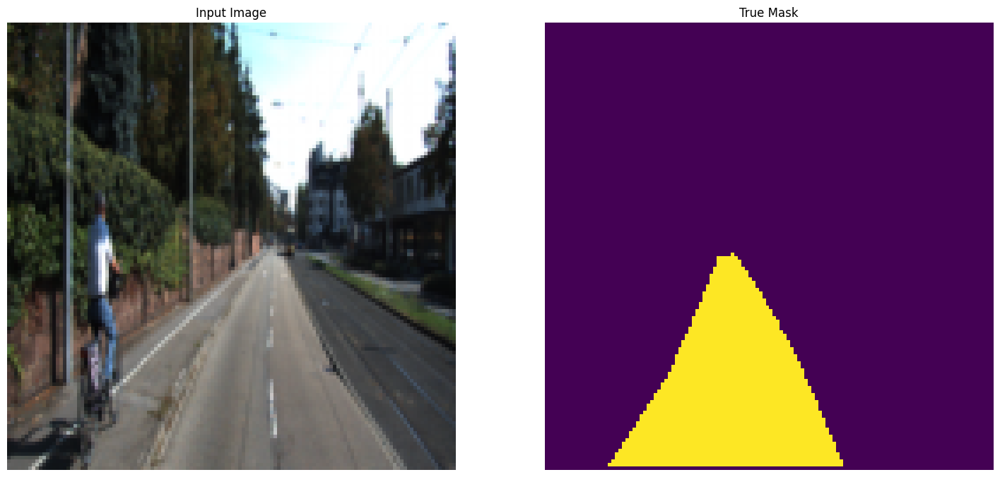

In [14]:
display_sample([ds[0][0], ds[0][1]])

**Loading the Model**

In [15]:
# Defining the model

class VGG_FCN8(nn.Module):
    def __init__(self, num_classes=1):
        super(VGG_FCN8, self).__init__()
        vgg16 = models.vgg16(weights=VGG16_Weights.DEFAULT)
        features = vgg16.features

        # ------ Encoder ----------
        self.block3 = features[:17] # up to block3_pool
        self.block4 = features[17:24] # up to block4_pool
        self.block5 = features[24:31] # up to block5_pool

        # --------Decoder -----------
        self.up1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        # After concatenation
        self.conv1 = nn.Conv2d(512 + 512, 512, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(512)

        # 2nd Upsampling
        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv2 = nn.Conv2d(512 + 256, 256, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(256)

        # Final upsampling to match input size (128x128)
        self.up3 = nn.Upsample(scale_factor=8, mode='bilinear', align_corners=True)
        self.conv_out = nn.Conv2d(256, num_classes, kernel_size=1)
        
        # Activation
        self.activation = nn.Sigmoid()

    def forward(self, x):
        # --- Encoder ---
        c1 = self.block3(x)   # (N, 256, 16, 16)
        c2 = self.block4(c1)  # (N, 512, 8, 8)
        c3 = self.block5(c2)  # (N, 512, 4, 4)
        
        # --- Decoder ---
        u1 = self.up1(c3)          # (N, 512, 8, 8)
        d1 = torch.cat([u1, c2], dim=1)  # concat along channels
        d1 = self.bn1(self.conv1(d1))
        d1 = torch.relu(d1)
        
        u2 = self.up2(d1)          # (N, 512, 16, 16)
        d2 = torch.cat([u2, c1], dim=1)
        d2 = self.bn2(self.conv2(d2))
        d2 = torch.relu(d2)
        
        # Final upsampling to match input size
        u3 = self.up3(d2)          # (N, 256, 128, 128)
        out = self.conv_out(u3)
        out = self.activation(out)
        
        return out

In [16]:
# Loading the model to the CPU

model = VGG_FCN8(num_classes=N_CLASSES)

In [17]:
# Moving the model to the GPU

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [18]:
model.to(device)

VGG_FCN8(
  (block3): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilatio

In [19]:
# Loss function for the model (for binary segmentation)
criterion = nn.BCELoss()
# Optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)
m_iou = BinaryJaccardIndex().to(device)

**Training the Model**

In [20]:
# Training Loop

def train_model(model, train_loader, val_loader, epochs=10):
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0

        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device).float()

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            
        # Validation
        model.eval()
        val_iou = 0.0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                val_iou += m_iou(outputs, masks)

        print(f"Epoch [{epoch+1}/{epochs}] | Loss: {train_loss/len(train_loader.dataset):.4f} | mIoU: {val_iou/len(val_loader):.4f}")
        
        # --- Visualization after each epoch ---
        with torch.no_grad():
            # Pick one random batch from val_loader
            sample_images, sample_masks = next(iter(val_loader))
            sample_images, sample_masks = sample_images.to(device), sample_masks.to(device).float()
            preds = model(sample_images)

            # Take only the first sample from the batch
            image = sample_images[0].cpu()
            mask = sample_masks[0].cpu()
            pred = preds[0].cpu()

            # Convert predicted mask to binary for better visualization
            pred_binary = (pred > 0.5).float()

            display_sample([image, mask, pred_binary])
            
        print('-' * 60)

Epoch [1/100] | Loss: 0.4478 | mIoU: 0.6004


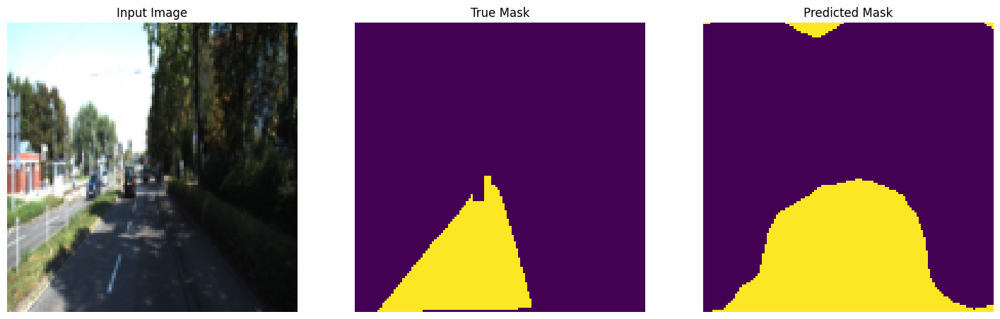

------------------------------------------------------------
Epoch [2/100] | Loss: 0.2467 | mIoU: 0.7013


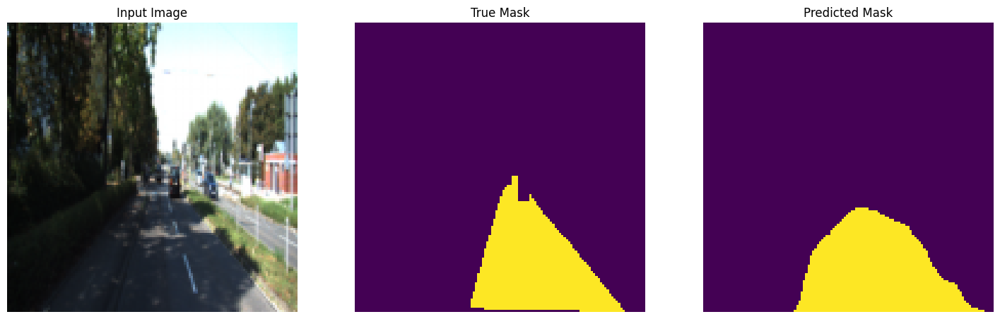

------------------------------------------------------------
Epoch [3/100] | Loss: 0.1891 | mIoU: 0.7958


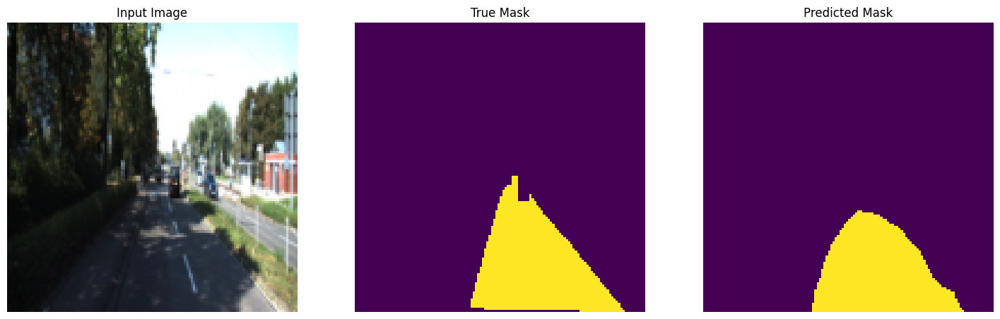

------------------------------------------------------------
Epoch [4/100] | Loss: 0.1649 | mIoU: 0.8001


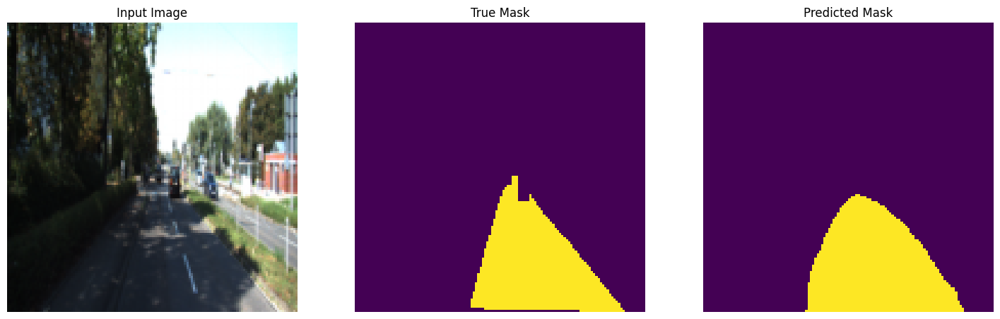

------------------------------------------------------------
Epoch [5/100] | Loss: 0.1452 | mIoU: 0.8128


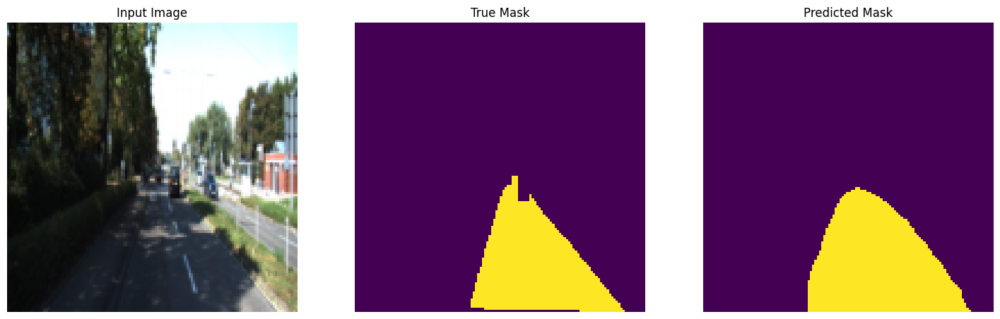

------------------------------------------------------------
Epoch [6/100] | Loss: 0.1342 | mIoU: 0.8220


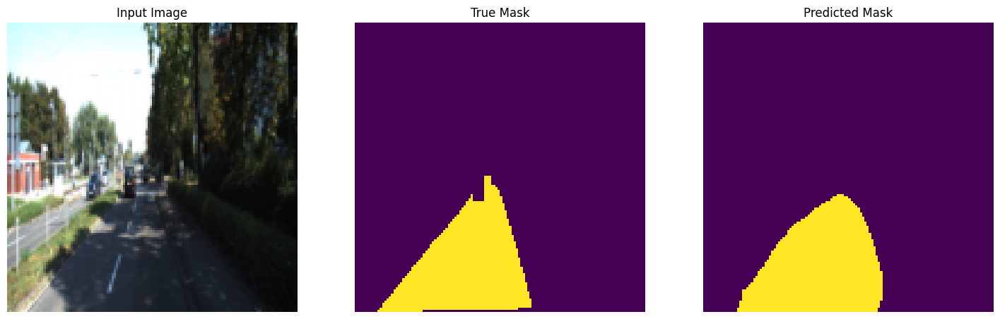

------------------------------------------------------------
Epoch [7/100] | Loss: 0.1232 | mIoU: 0.8261


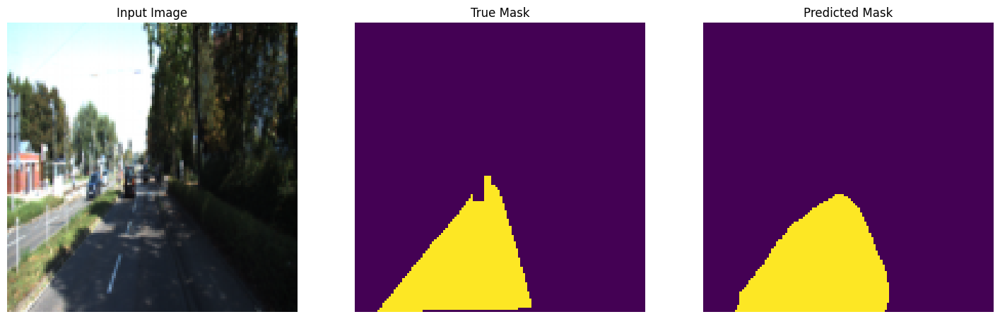

------------------------------------------------------------
Epoch [8/100] | Loss: 0.1141 | mIoU: 0.8395


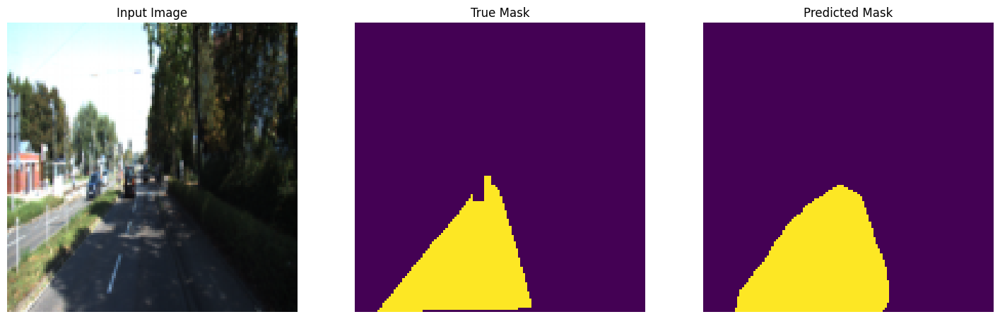

------------------------------------------------------------
Epoch [9/100] | Loss: 0.1061 | mIoU: 0.8401


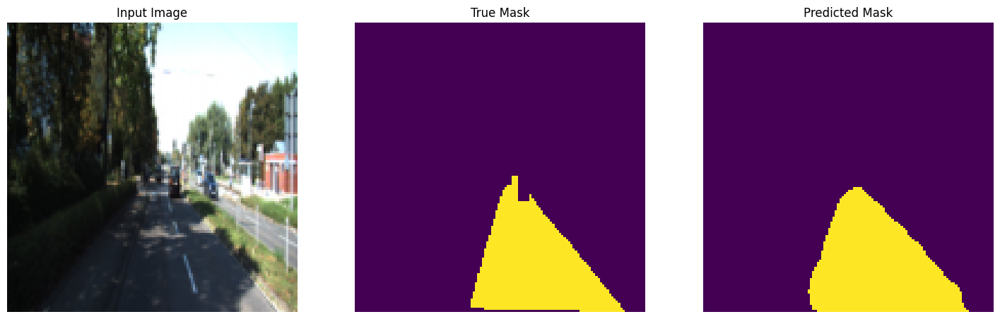

------------------------------------------------------------
Epoch [10/100] | Loss: 0.1007 | mIoU: 0.8388


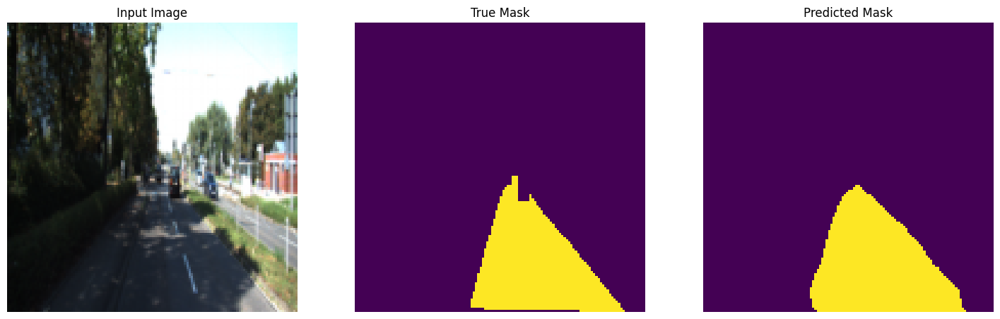

------------------------------------------------------------
Epoch [11/100] | Loss: 0.0956 | mIoU: 0.8502


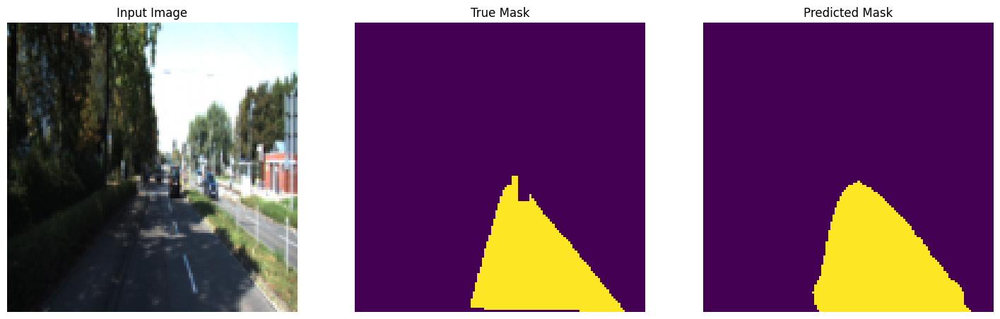

------------------------------------------------------------
Epoch [12/100] | Loss: 0.0907 | mIoU: 0.8493


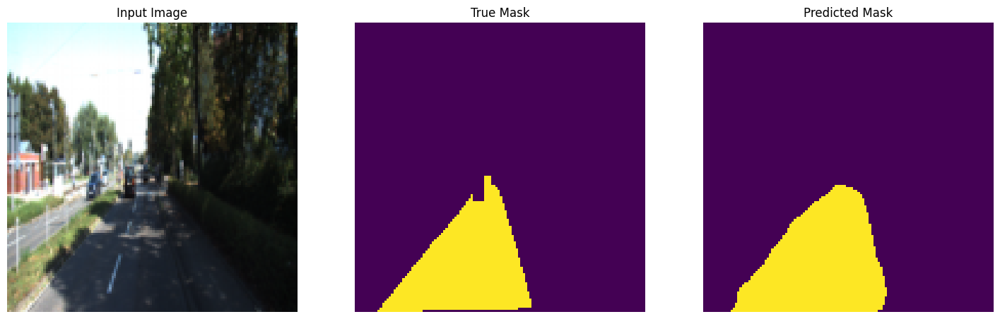

------------------------------------------------------------
Epoch [13/100] | Loss: 0.0861 | mIoU: 0.8504


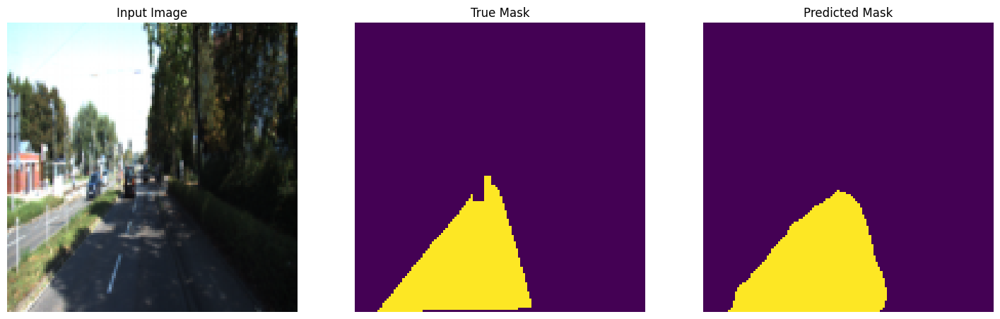

------------------------------------------------------------
Epoch [14/100] | Loss: 0.0817 | mIoU: 0.8408


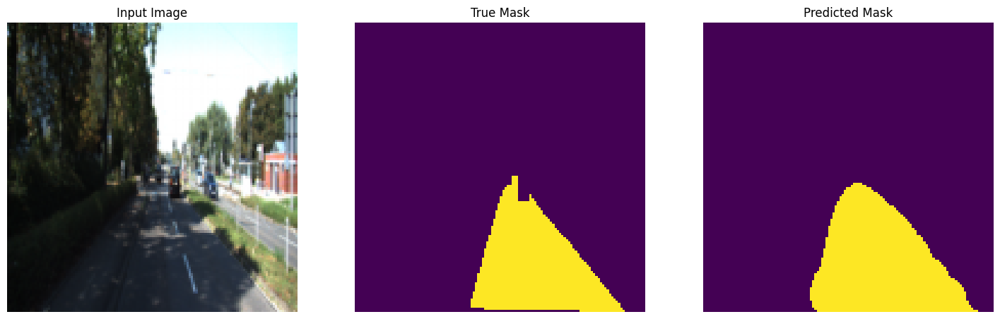

------------------------------------------------------------
Epoch [15/100] | Loss: 0.0786 | mIoU: 0.8464


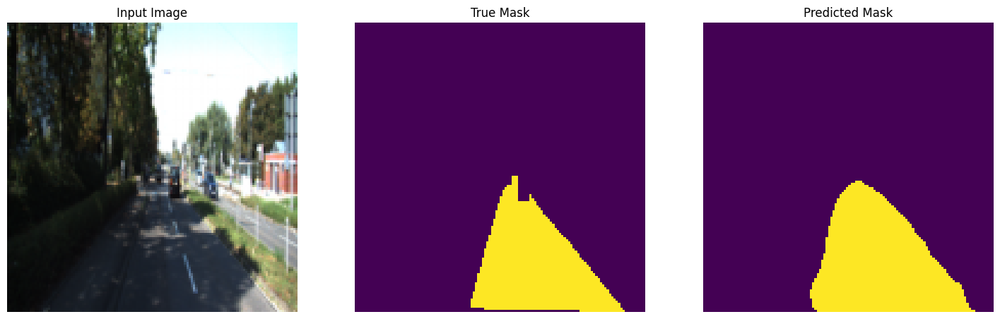

------------------------------------------------------------
Epoch [16/100] | Loss: 0.0777 | mIoU: 0.8268


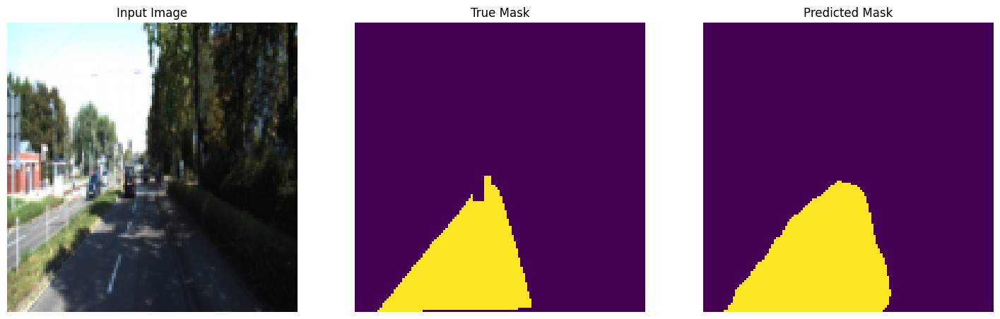

------------------------------------------------------------
Epoch [17/100] | Loss: 0.0751 | mIoU: 0.8572


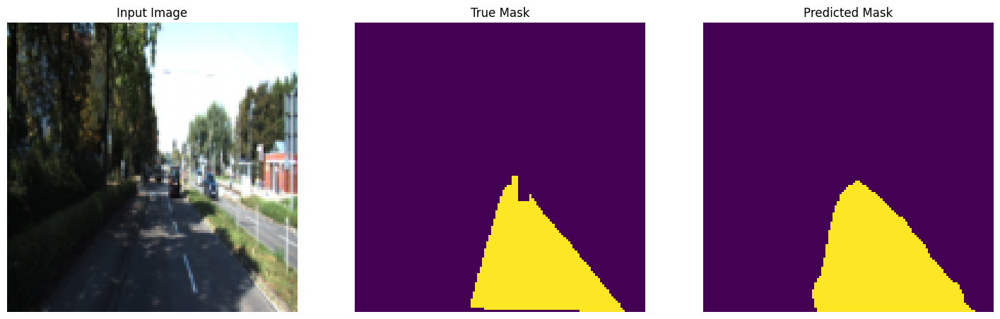

------------------------------------------------------------
Epoch [18/100] | Loss: 0.0723 | mIoU: 0.8299


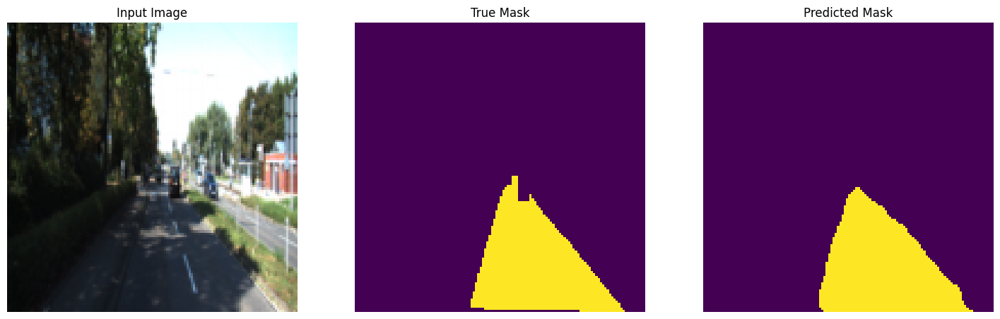

------------------------------------------------------------
Epoch [19/100] | Loss: 0.0703 | mIoU: 0.8384


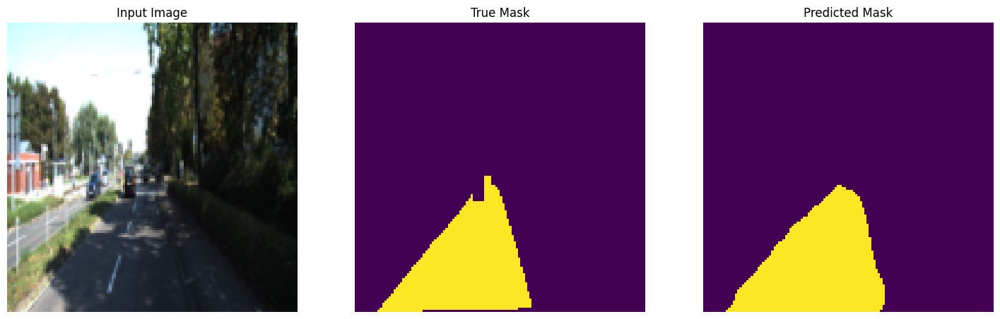

------------------------------------------------------------
Epoch [20/100] | Loss: 0.0697 | mIoU: 0.8557


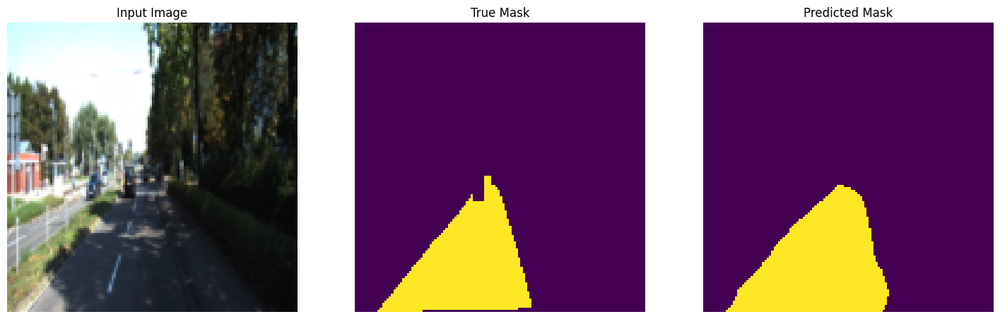

------------------------------------------------------------
Epoch [21/100] | Loss: 0.0659 | mIoU: 0.8547


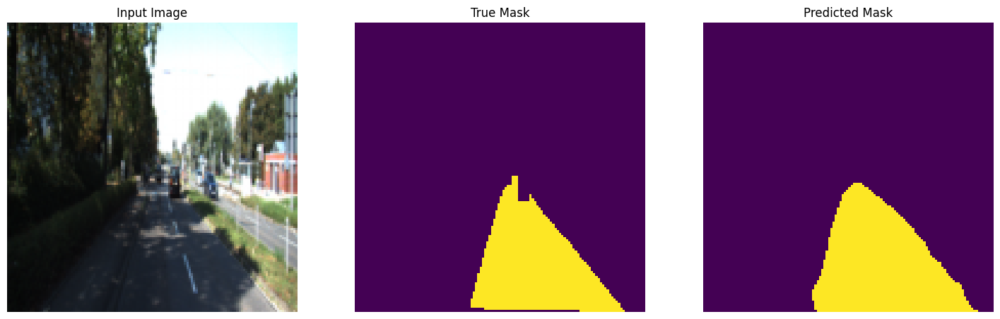

------------------------------------------------------------
Epoch [22/100] | Loss: 0.0637 | mIoU: 0.8645


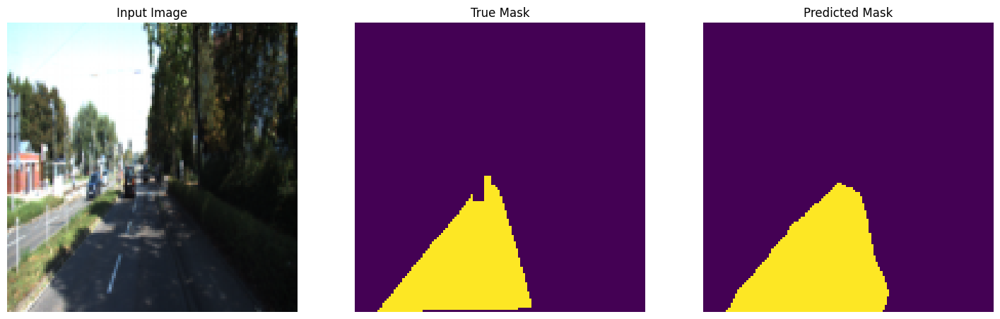

------------------------------------------------------------
Epoch [23/100] | Loss: 0.0616 | mIoU: 0.8628


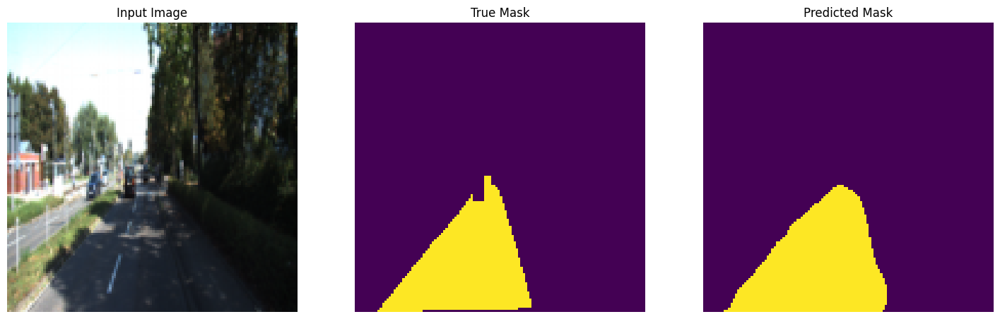

------------------------------------------------------------
Epoch [24/100] | Loss: 0.0599 | mIoU: 0.8712


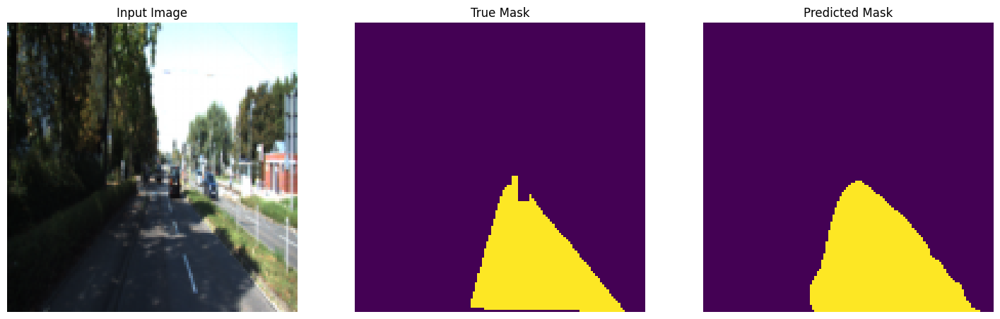

------------------------------------------------------------
Epoch [25/100] | Loss: 0.0587 | mIoU: 0.8638


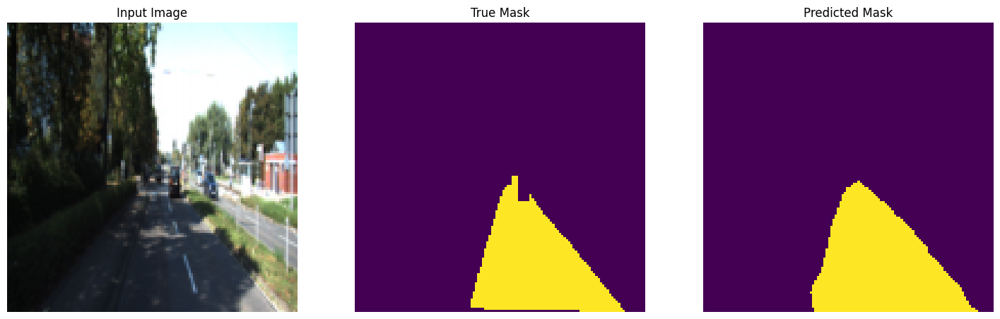

------------------------------------------------------------
Epoch [26/100] | Loss: 0.0577 | mIoU: 0.8494


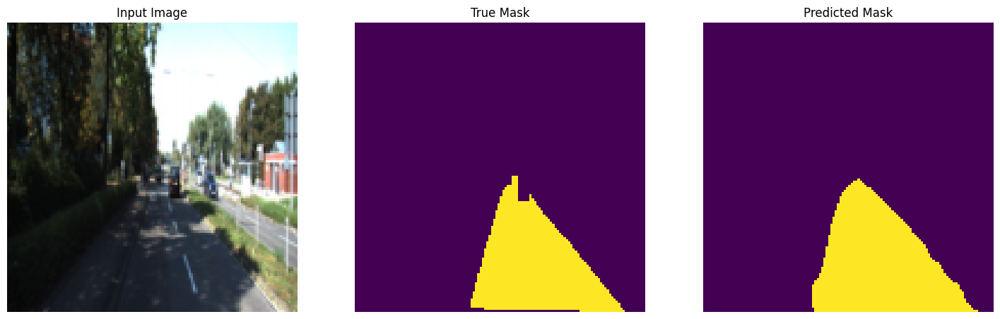

------------------------------------------------------------
Epoch [27/100] | Loss: 0.0566 | mIoU: 0.8490


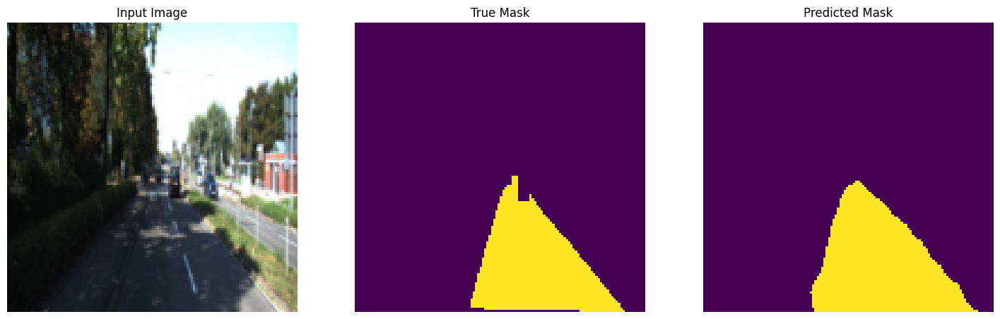

------------------------------------------------------------
Epoch [28/100] | Loss: 0.0548 | mIoU: 0.8560


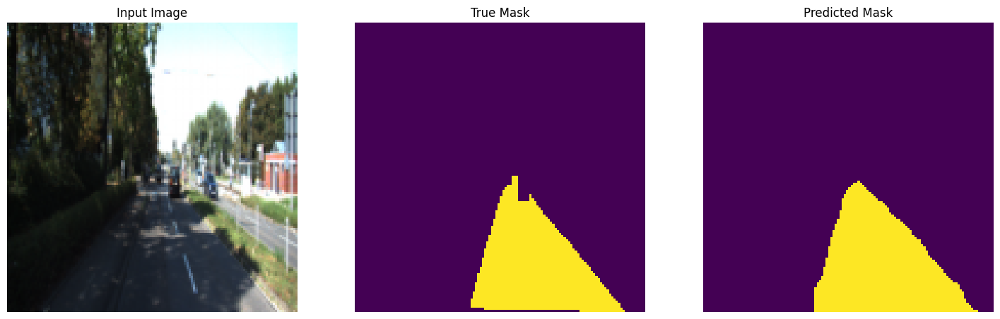

------------------------------------------------------------
Epoch [29/100] | Loss: 0.0540 | mIoU: 0.8530


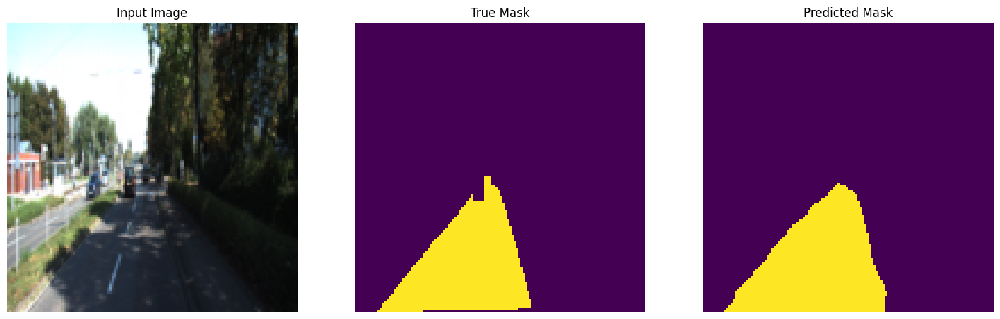

------------------------------------------------------------
Epoch [30/100] | Loss: 0.0529 | mIoU: 0.8649


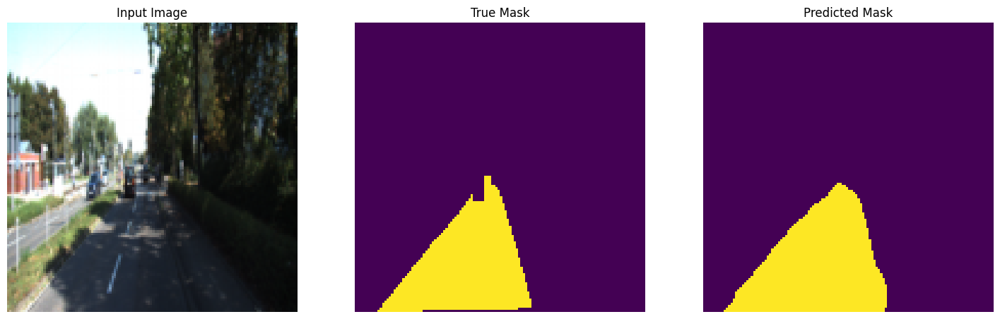

------------------------------------------------------------
Epoch [31/100] | Loss: 0.0510 | mIoU: 0.8724


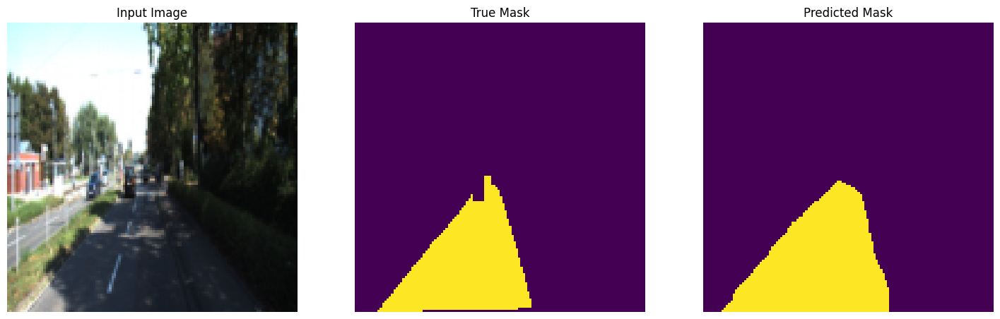

------------------------------------------------------------
Epoch [32/100] | Loss: 0.0499 | mIoU: 0.8689


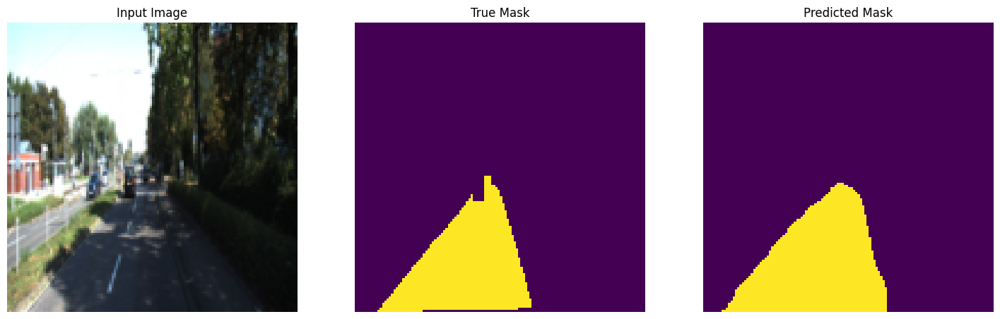

------------------------------------------------------------
Epoch [33/100] | Loss: 0.0488 | mIoU: 0.8678


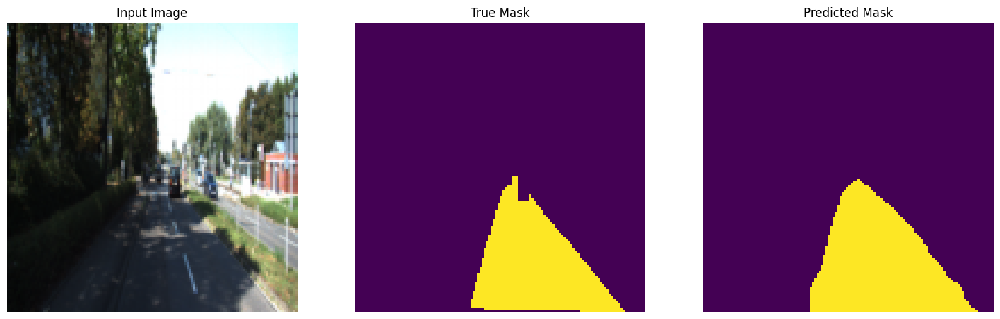

------------------------------------------------------------
Epoch [34/100] | Loss: 0.0477 | mIoU: 0.8684


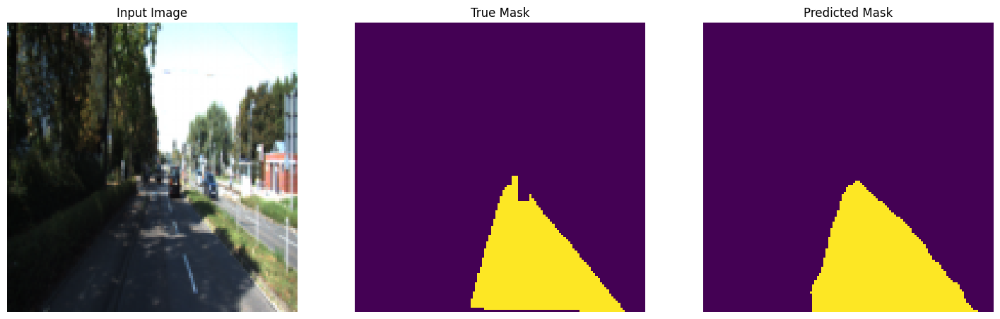

------------------------------------------------------------
Epoch [35/100] | Loss: 0.0470 | mIoU: 0.8779


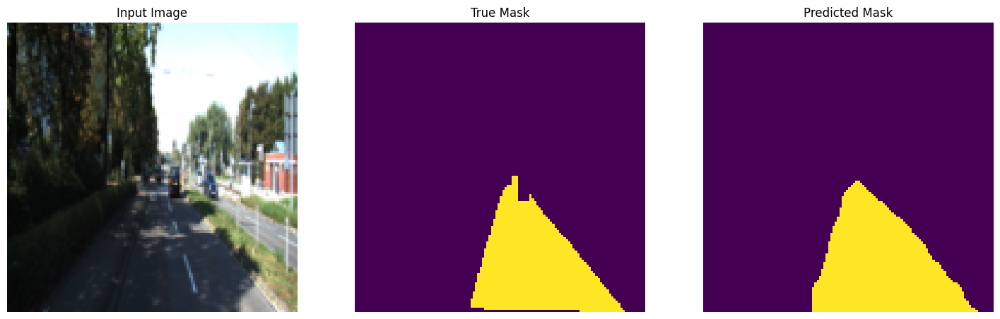

------------------------------------------------------------
Epoch [36/100] | Loss: 0.0461 | mIoU: 0.8692


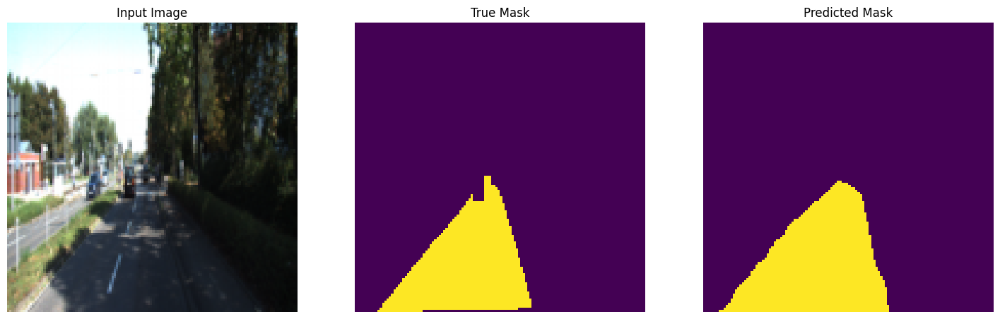

------------------------------------------------------------
Epoch [37/100] | Loss: 0.0450 | mIoU: 0.8540


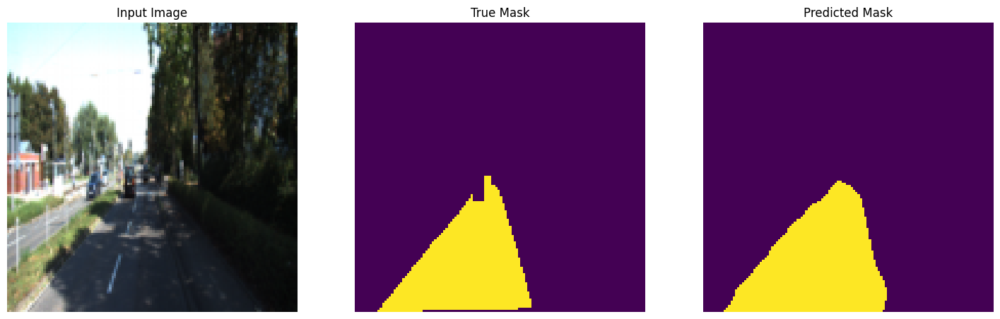

------------------------------------------------------------
Epoch [38/100] | Loss: 0.0444 | mIoU: 0.8633


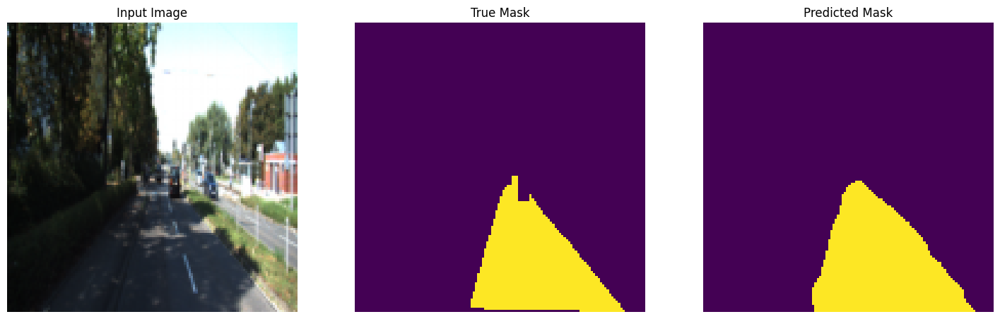

------------------------------------------------------------
Epoch [39/100] | Loss: 0.0438 | mIoU: 0.8728


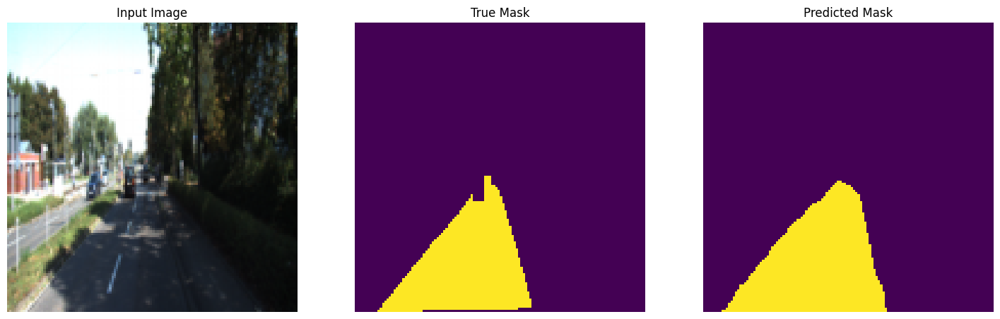

------------------------------------------------------------
Epoch [40/100] | Loss: 0.0427 | mIoU: 0.8638


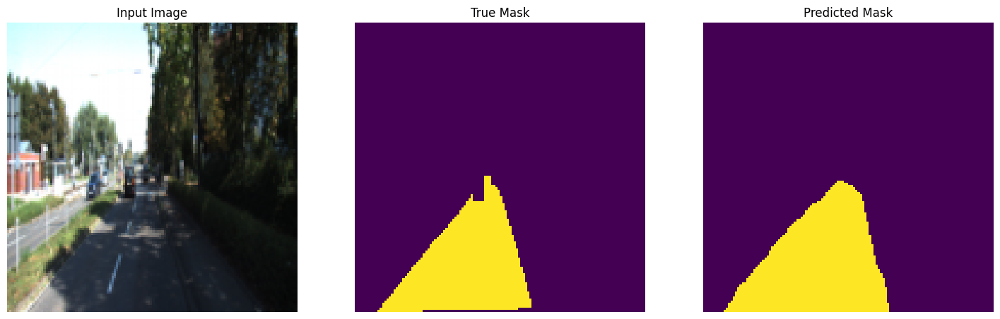

------------------------------------------------------------
Epoch [41/100] | Loss: 0.0422 | mIoU: 0.8596


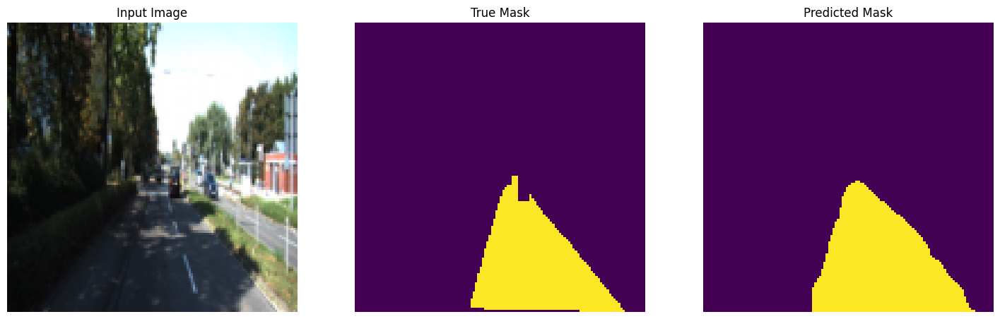

------------------------------------------------------------
Epoch [42/100] | Loss: 0.0414 | mIoU: 0.8625


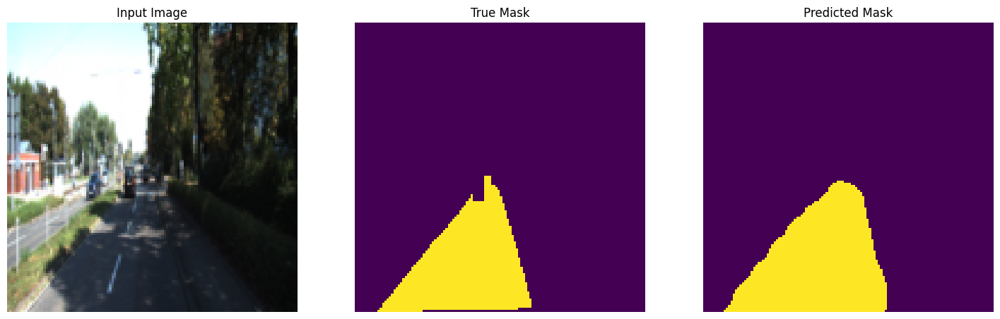

------------------------------------------------------------
Epoch [43/100] | Loss: 0.0415 | mIoU: 0.8761


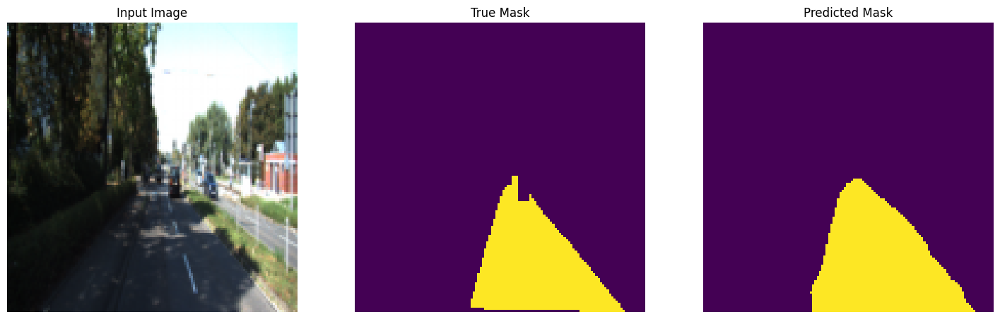

------------------------------------------------------------
Epoch [44/100] | Loss: 0.0410 | mIoU: 0.8780


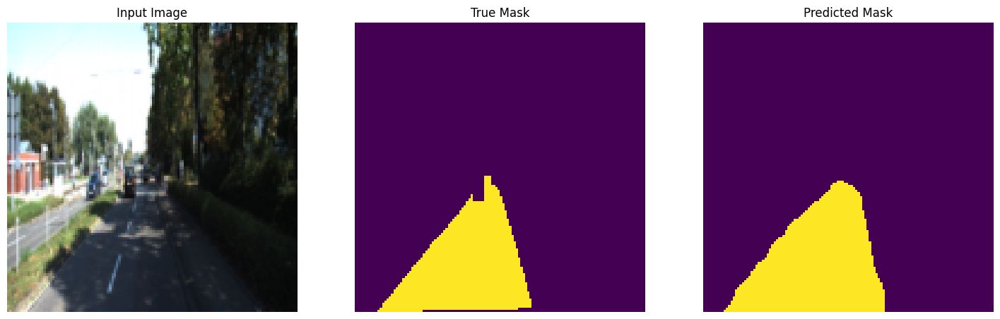

------------------------------------------------------------
Epoch [45/100] | Loss: 0.0401 | mIoU: 0.8708


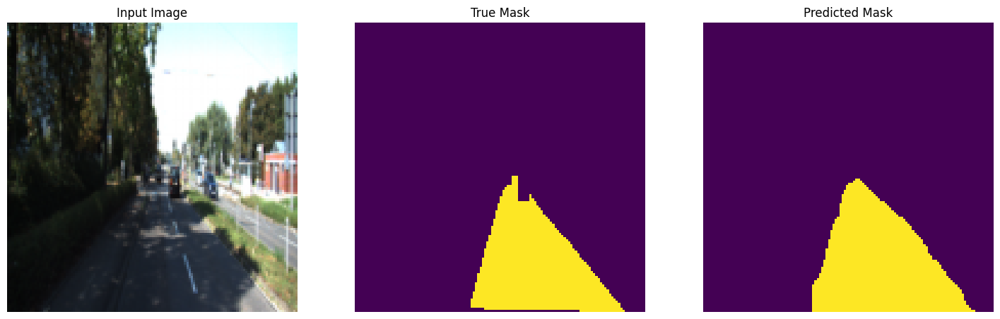

------------------------------------------------------------
Epoch [46/100] | Loss: 0.0394 | mIoU: 0.8670


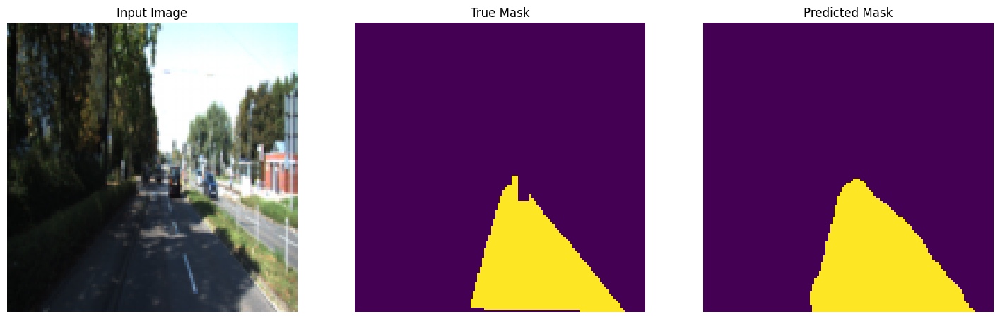

------------------------------------------------------------
Epoch [47/100] | Loss: 0.0390 | mIoU: 0.8708


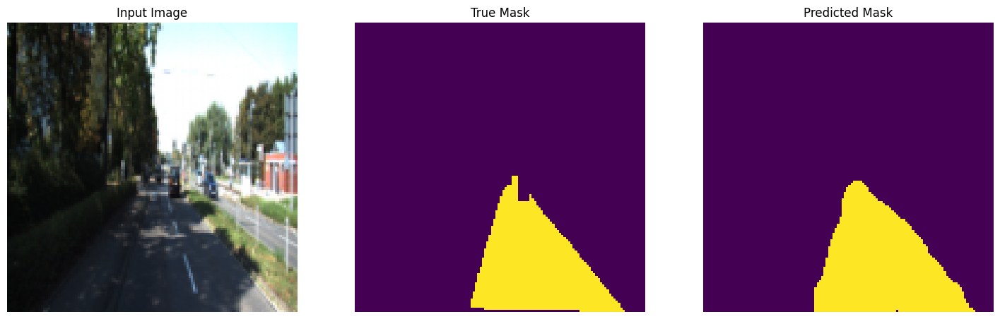

------------------------------------------------------------
Epoch [48/100] | Loss: 0.0388 | mIoU: 0.8686


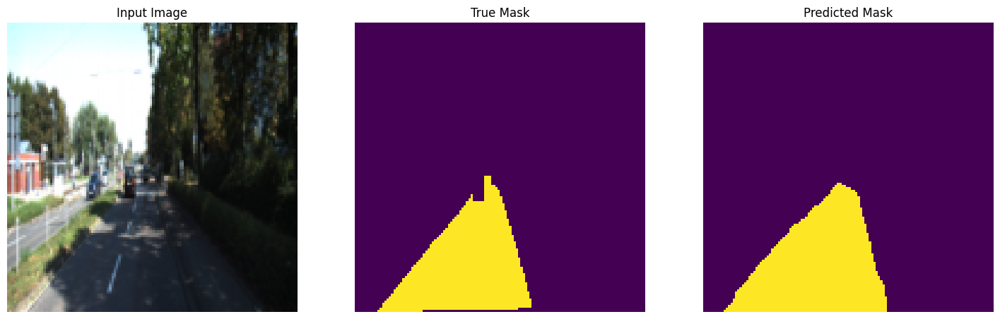

------------------------------------------------------------
Epoch [49/100] | Loss: 0.0379 | mIoU: 0.8831


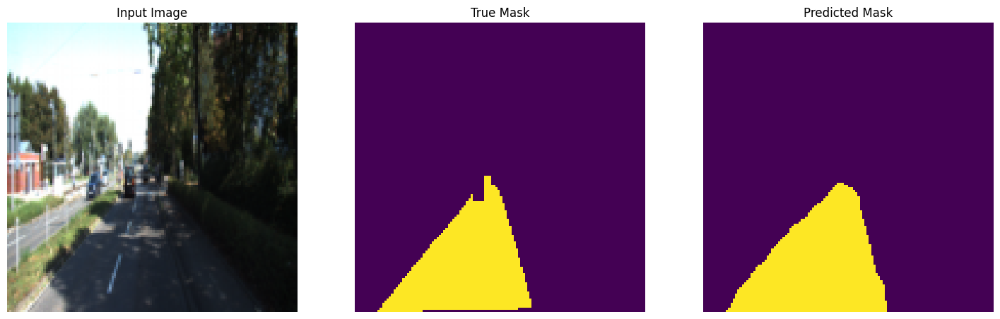

------------------------------------------------------------
Epoch [50/100] | Loss: 0.0374 | mIoU: 0.8746


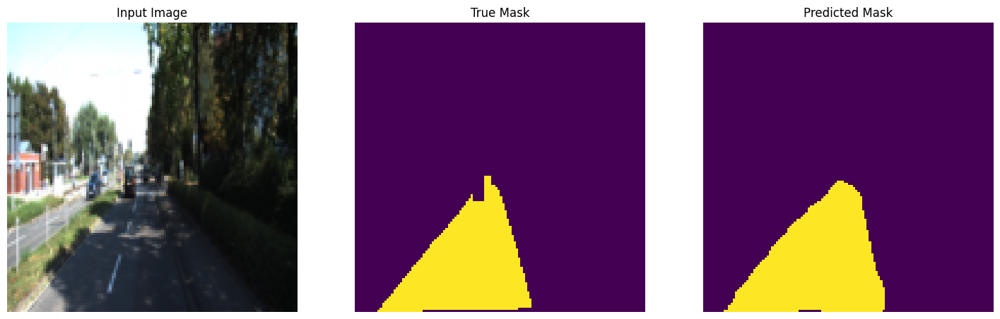

------------------------------------------------------------
Epoch [51/100] | Loss: 0.0369 | mIoU: 0.8679


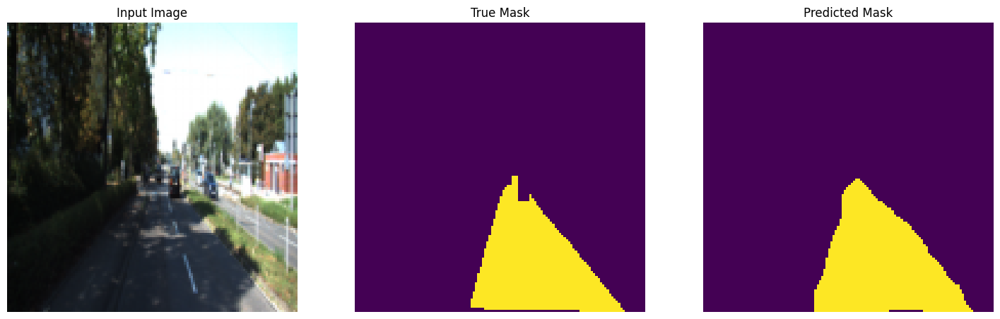

------------------------------------------------------------
Epoch [52/100] | Loss: 0.0362 | mIoU: 0.8798


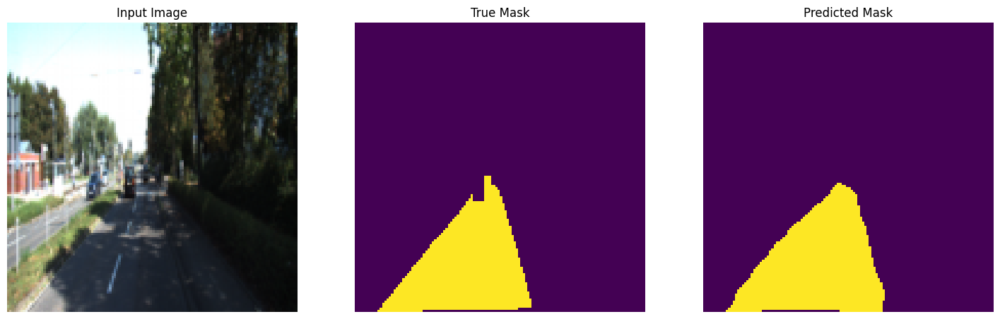

------------------------------------------------------------
Epoch [53/100] | Loss: 0.0363 | mIoU: 0.8806


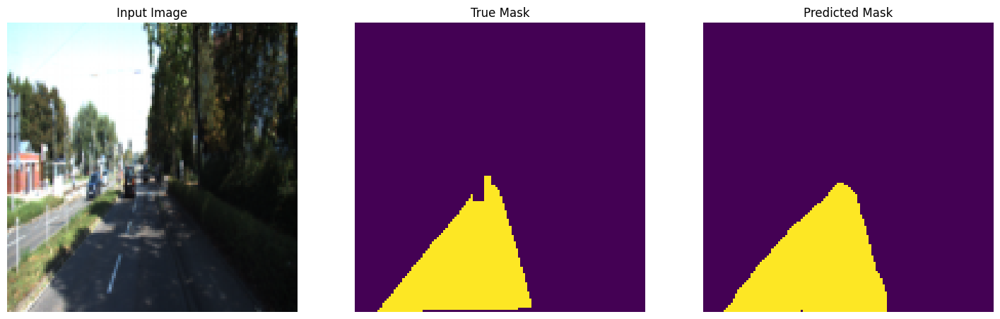

------------------------------------------------------------
Epoch [54/100] | Loss: 0.0354 | mIoU: 0.8810


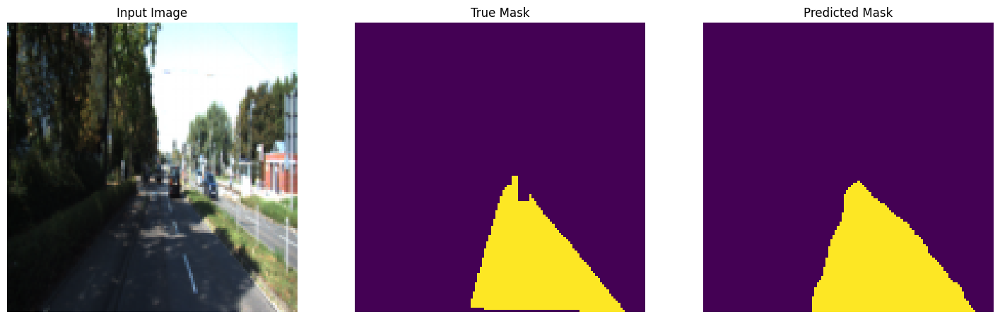

------------------------------------------------------------
Epoch [55/100] | Loss: 0.0347 | mIoU: 0.8826


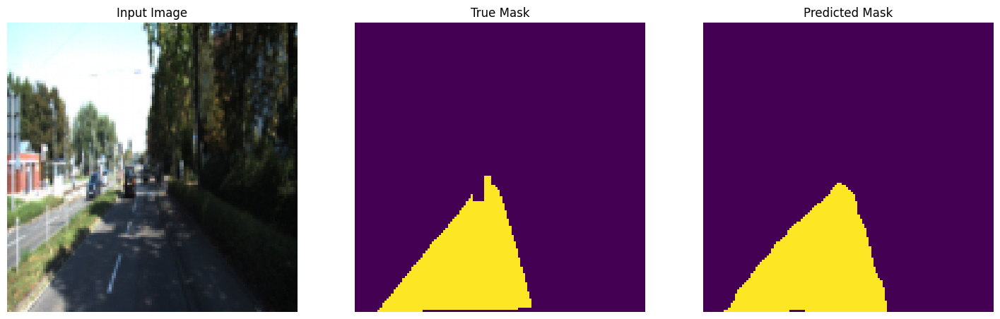

------------------------------------------------------------
Epoch [56/100] | Loss: 0.0343 | mIoU: 0.8803


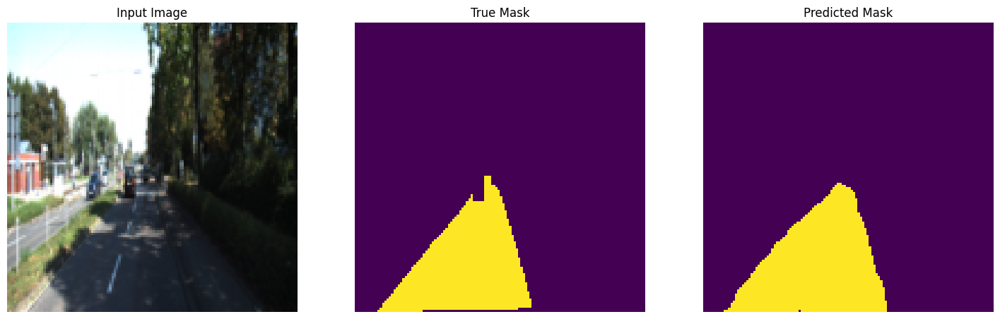

------------------------------------------------------------
Epoch [57/100] | Loss: 0.0341 | mIoU: 0.8797


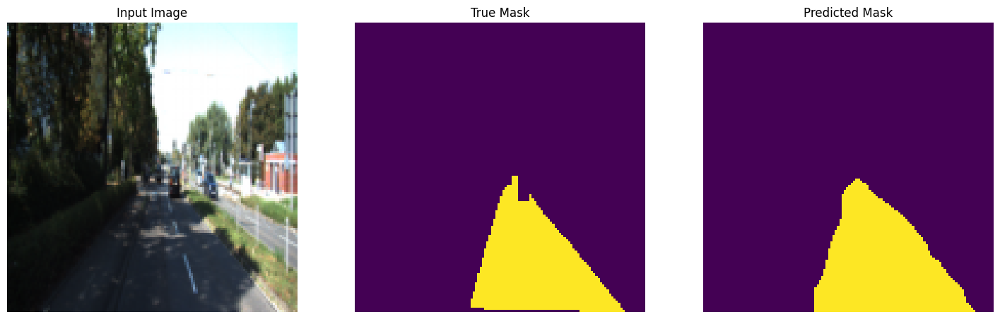

------------------------------------------------------------
Epoch [58/100] | Loss: 0.0340 | mIoU: 0.8811


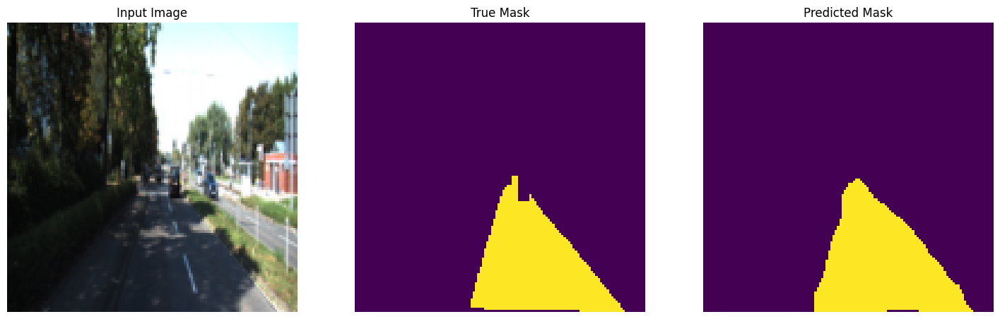

------------------------------------------------------------
Epoch [59/100] | Loss: 0.0334 | mIoU: 0.8749


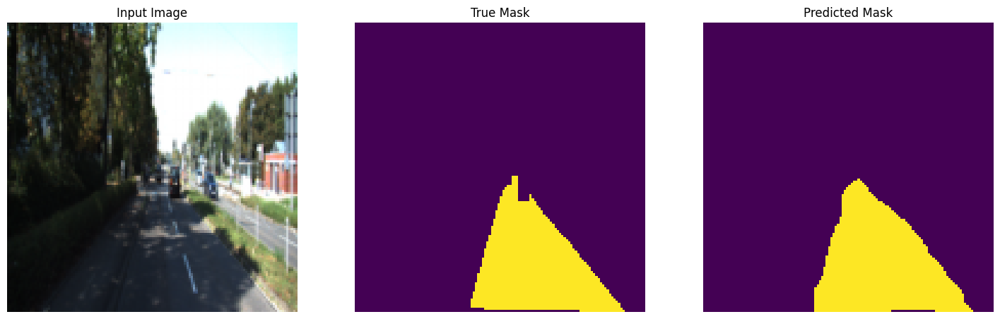

------------------------------------------------------------
Epoch [60/100] | Loss: 0.0331 | mIoU: 0.8834


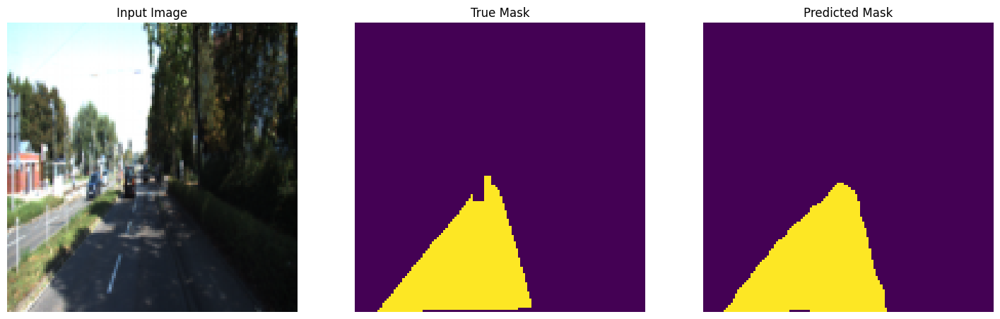

------------------------------------------------------------
Epoch [61/100] | Loss: 0.0328 | mIoU: 0.8981


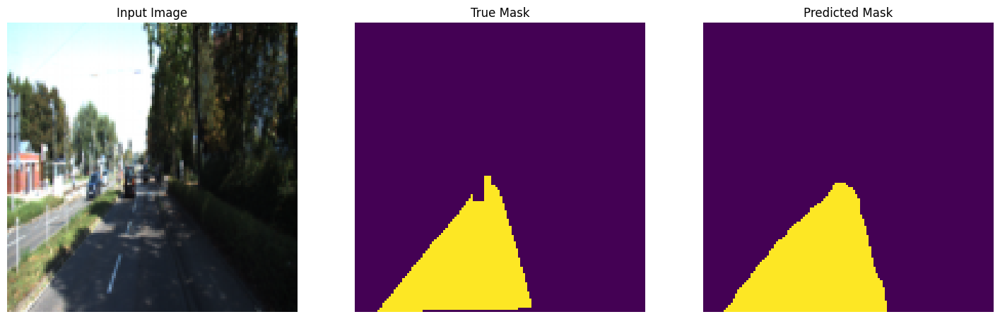

------------------------------------------------------------
Epoch [62/100] | Loss: 0.0322 | mIoU: 0.8740


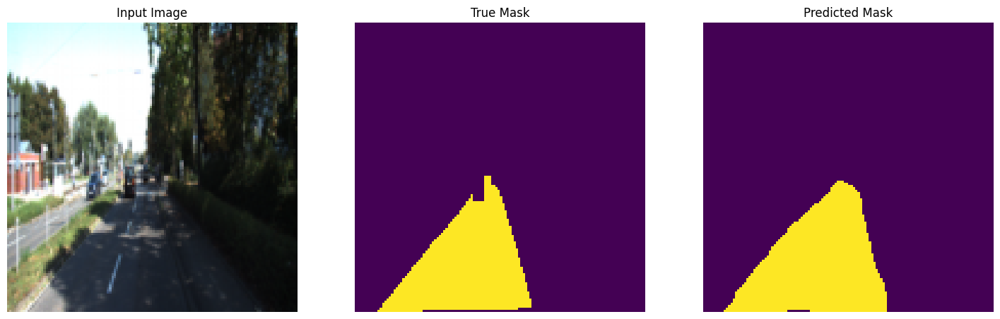

------------------------------------------------------------
Epoch [63/100] | Loss: 0.0323 | mIoU: 0.8896


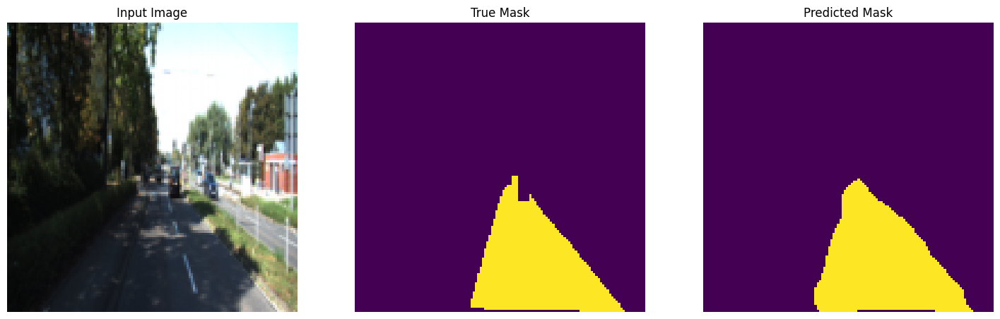

------------------------------------------------------------
Epoch [64/100] | Loss: 0.0316 | mIoU: 0.8841


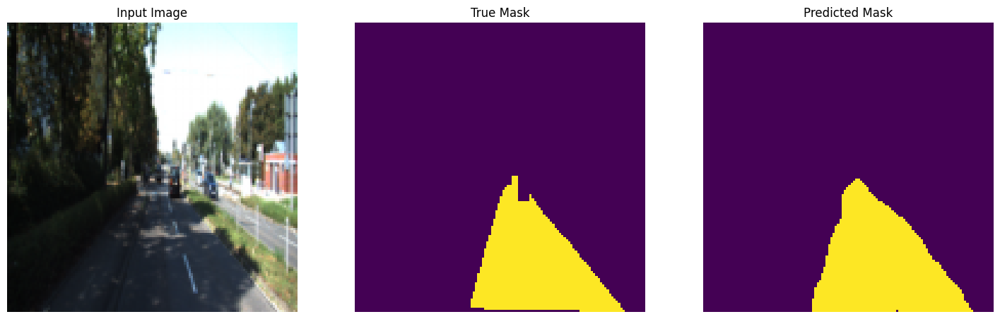

------------------------------------------------------------
Epoch [65/100] | Loss: 0.0313 | mIoU: 0.8787


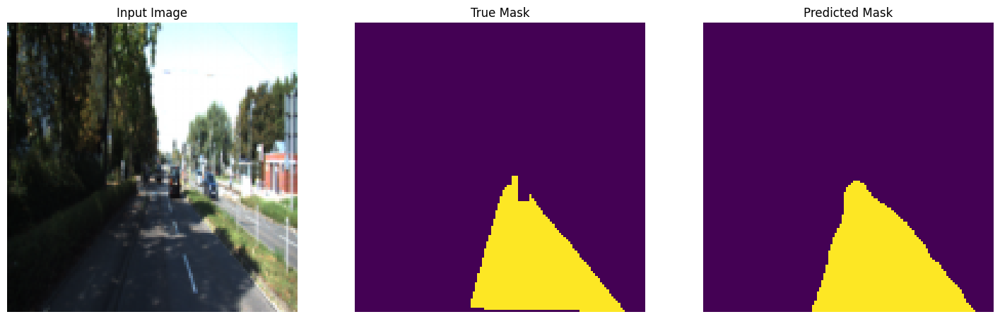

------------------------------------------------------------
Epoch [66/100] | Loss: 0.0311 | mIoU: 0.8738


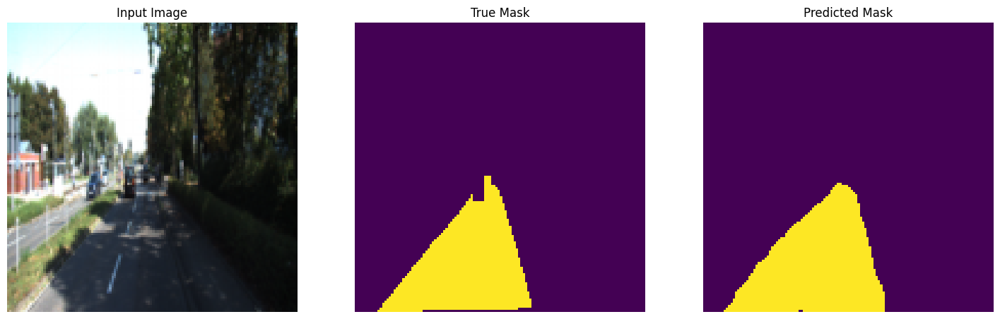

------------------------------------------------------------
Epoch [67/100] | Loss: 0.0315 | mIoU: 0.8797


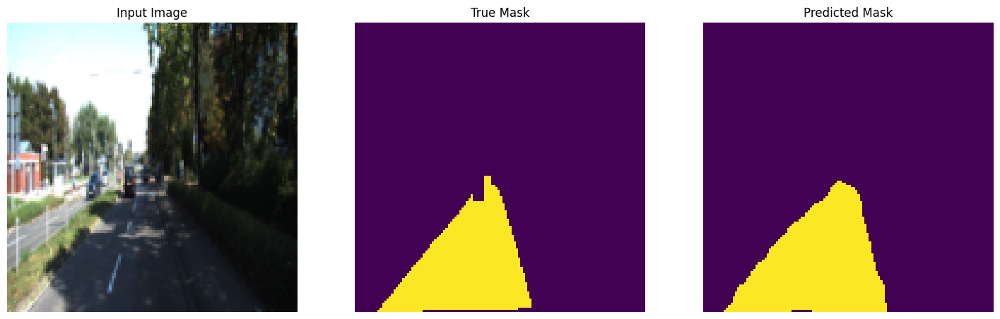

------------------------------------------------------------
Epoch [68/100] | Loss: 0.0305 | mIoU: 0.8742


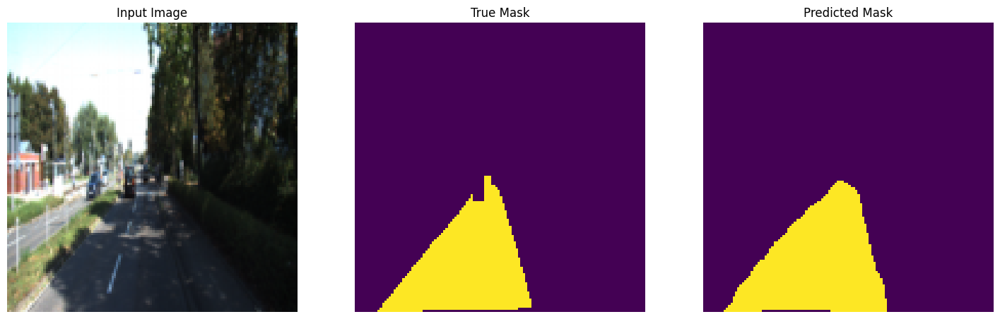

------------------------------------------------------------
Epoch [69/100] | Loss: 0.0299 | mIoU: 0.8764


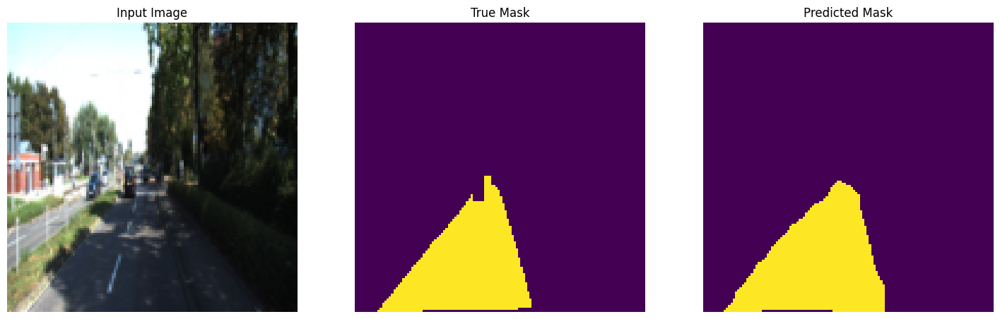

------------------------------------------------------------
Epoch [70/100] | Loss: 0.0294 | mIoU: 0.8868


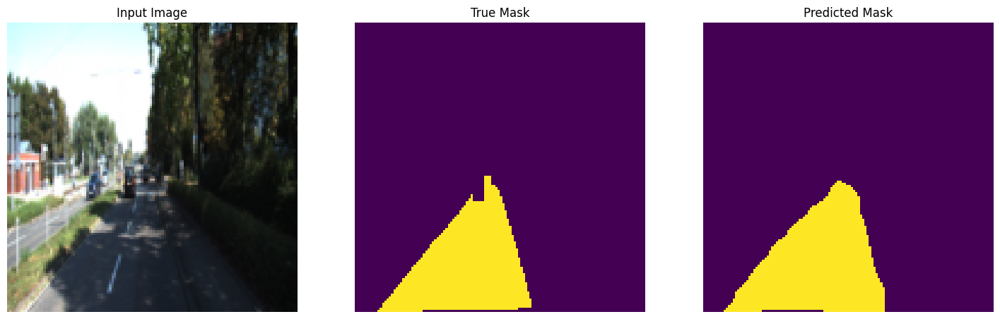

------------------------------------------------------------
Epoch [71/100] | Loss: 0.0292 | mIoU: 0.8909


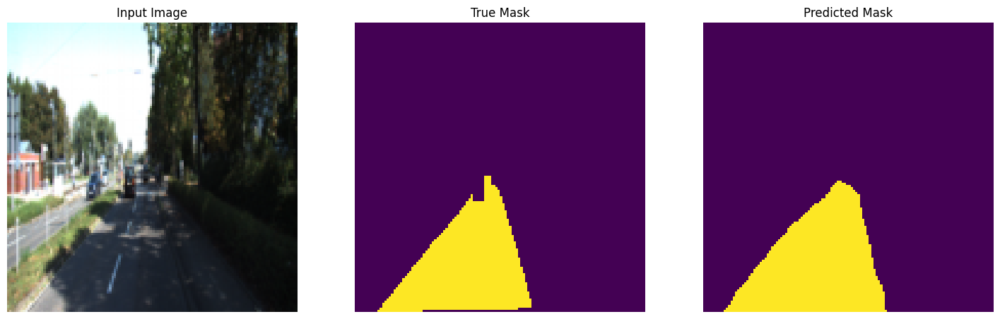

------------------------------------------------------------
Epoch [72/100] | Loss: 0.0288 | mIoU: 0.8865


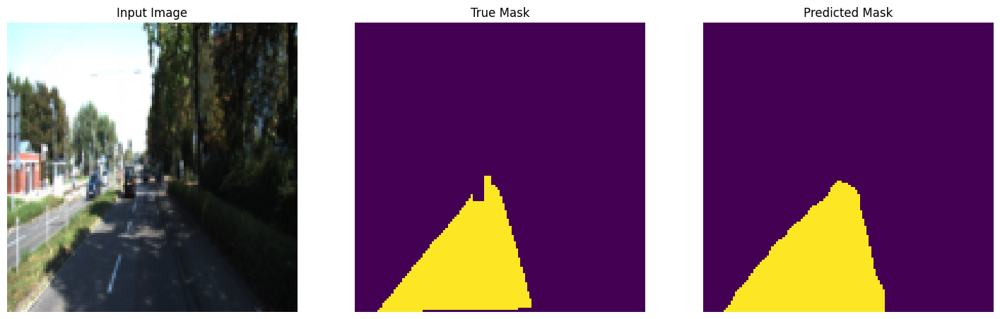

------------------------------------------------------------
Epoch [73/100] | Loss: 0.0285 | mIoU: 0.8802


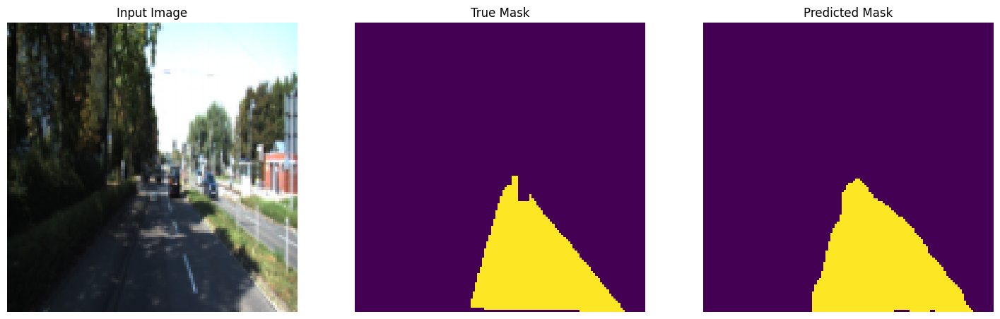

------------------------------------------------------------
Epoch [74/100] | Loss: 0.0282 | mIoU: 0.8879


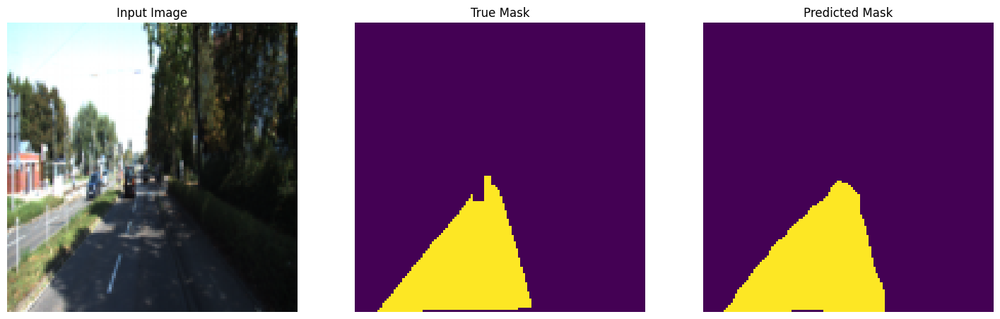

------------------------------------------------------------
Epoch [75/100] | Loss: 0.0284 | mIoU: 0.8831


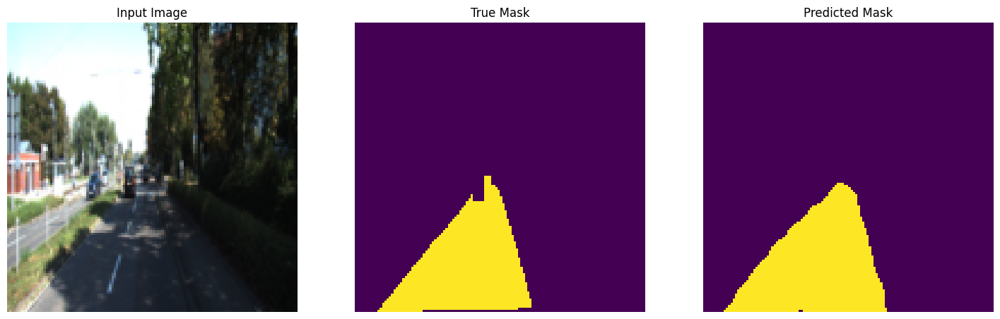

------------------------------------------------------------
Epoch [76/100] | Loss: 0.0280 | mIoU: 0.8866


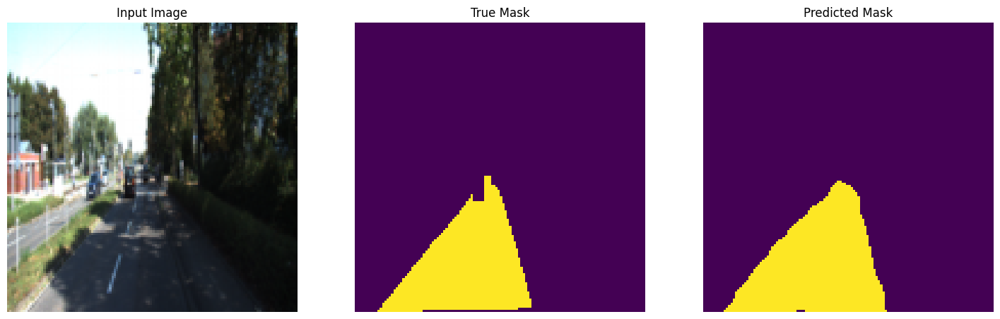

------------------------------------------------------------
Epoch [77/100] | Loss: 0.0282 | mIoU: 0.8679


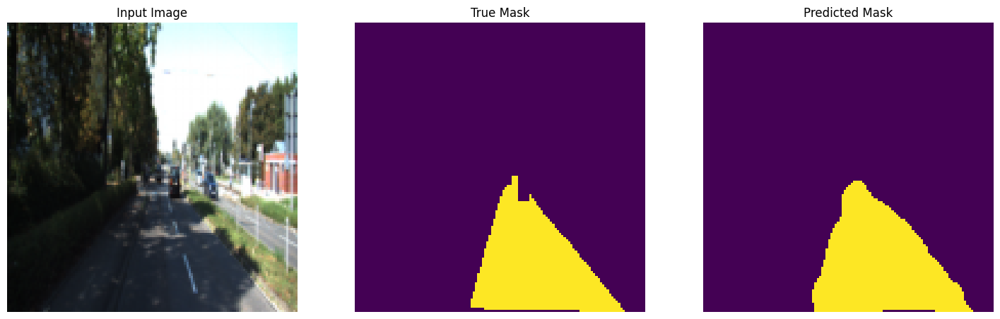

------------------------------------------------------------
Epoch [78/100] | Loss: 0.0281 | mIoU: 0.8873


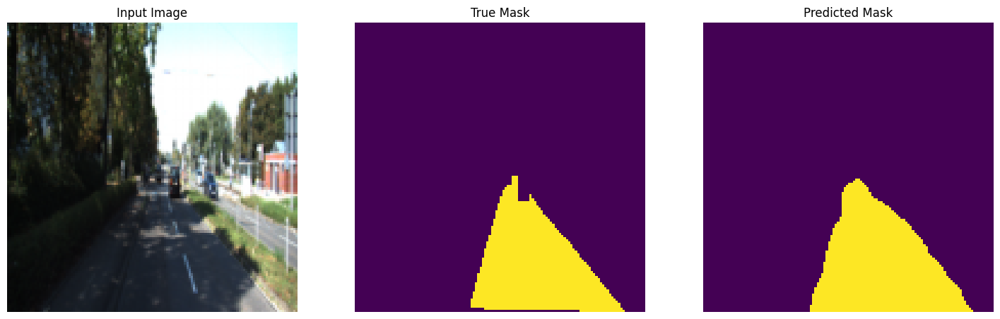

------------------------------------------------------------
Epoch [79/100] | Loss: 0.0275 | mIoU: 0.8739


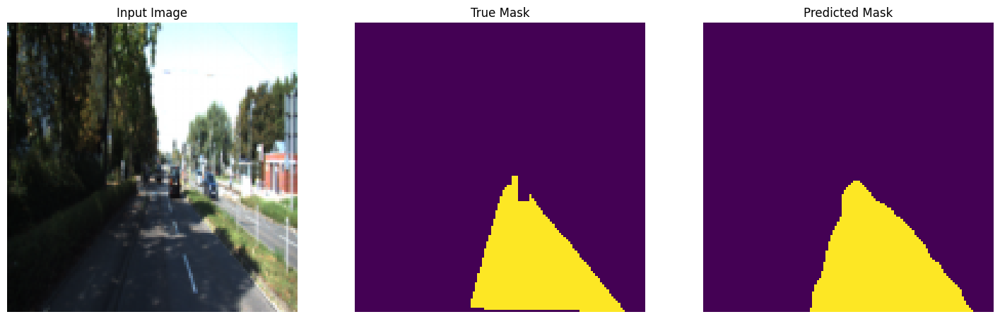

------------------------------------------------------------
Epoch [80/100] | Loss: 0.0272 | mIoU: 0.8915


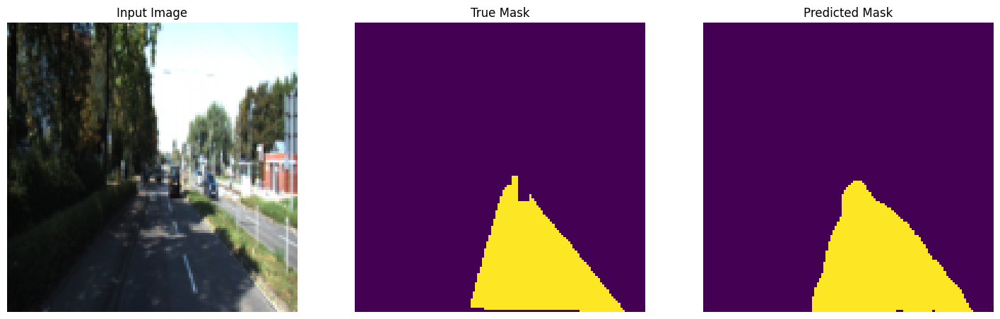

------------------------------------------------------------
Epoch [81/100] | Loss: 0.0270 | mIoU: 0.8765


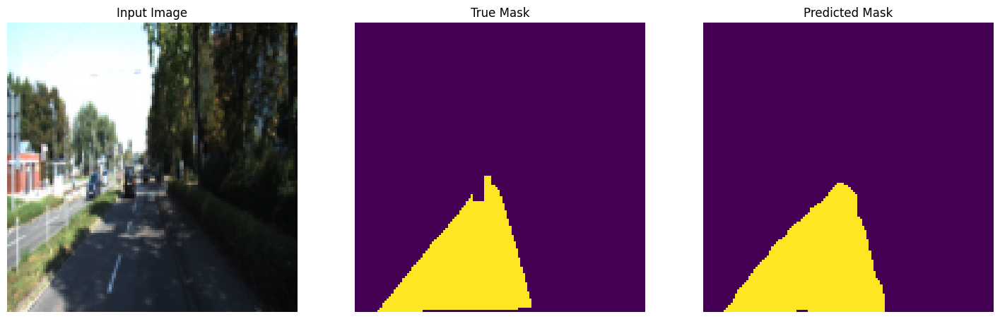

------------------------------------------------------------
Epoch [82/100] | Loss: 0.0272 | mIoU: 0.8934


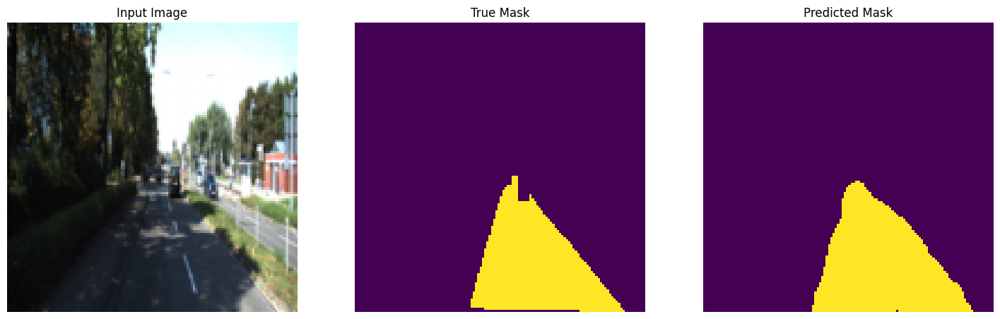

------------------------------------------------------------
Epoch [83/100] | Loss: 0.0267 | mIoU: 0.8827


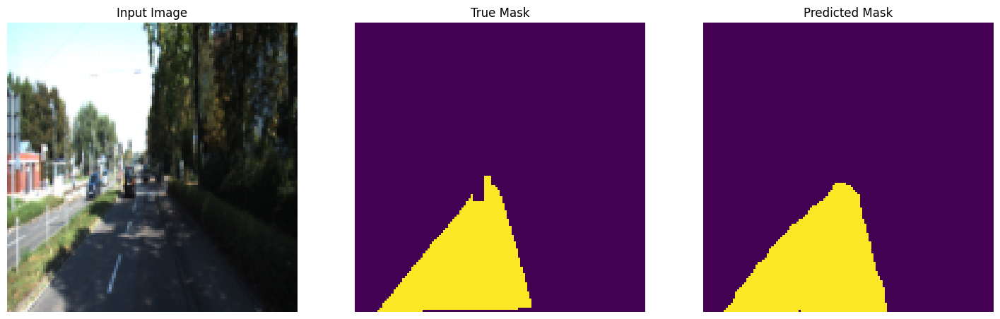

------------------------------------------------------------
Epoch [84/100] | Loss: 0.0262 | mIoU: 0.8720


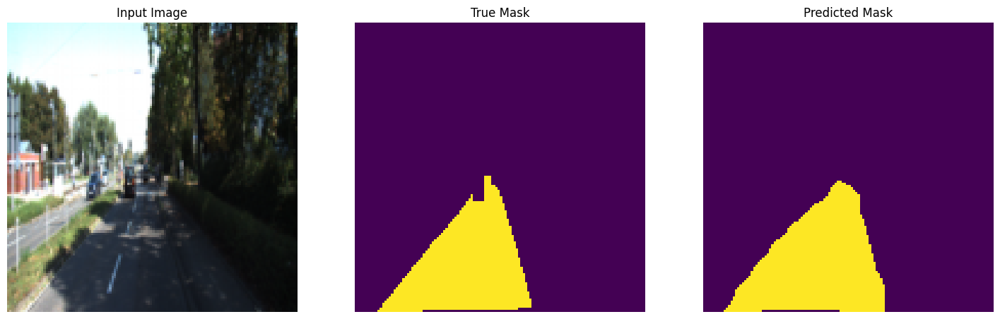

------------------------------------------------------------
Epoch [85/100] | Loss: 0.0263 | mIoU: 0.8844


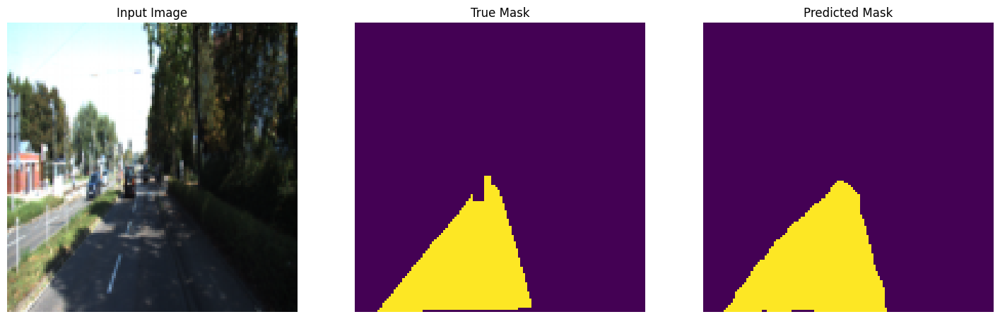

------------------------------------------------------------
Epoch [86/100] | Loss: 0.0261 | mIoU: 0.8816


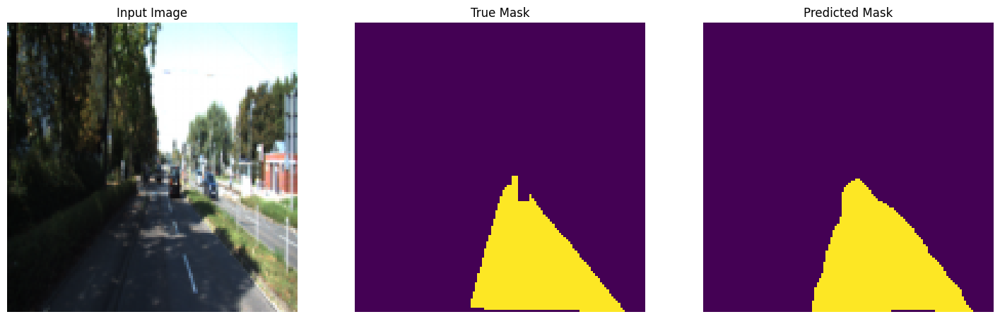

------------------------------------------------------------
Epoch [87/100] | Loss: 0.0259 | mIoU: 0.8860


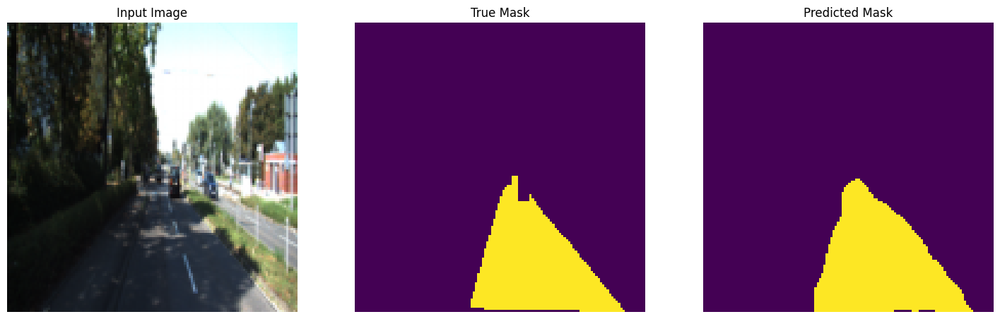

------------------------------------------------------------
Epoch [88/100] | Loss: 0.0257 | mIoU: 0.8779


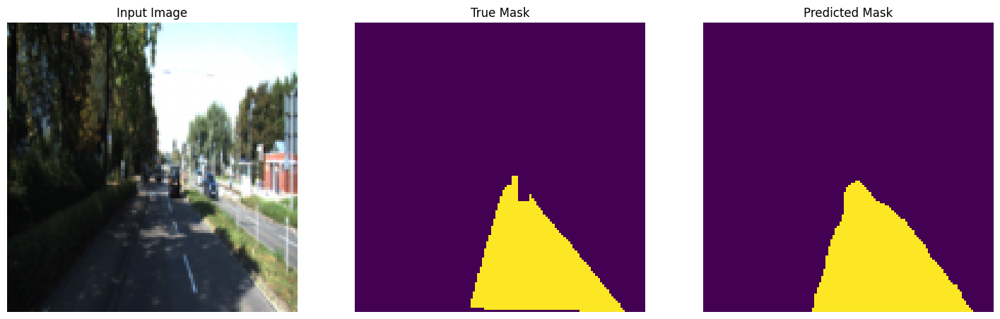

------------------------------------------------------------
Epoch [89/100] | Loss: 0.0257 | mIoU: 0.8836


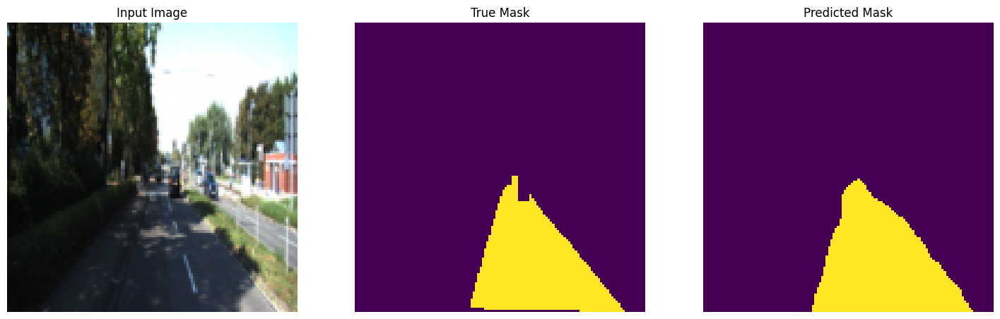

------------------------------------------------------------
Epoch [90/100] | Loss: 0.0253 | mIoU: 0.8848


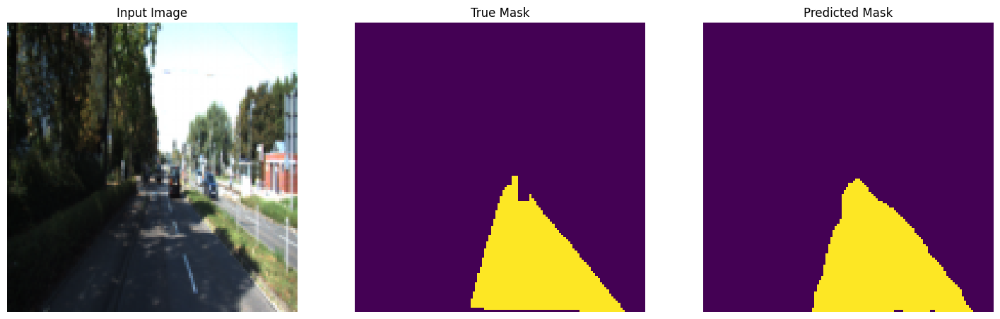

------------------------------------------------------------
Epoch [91/100] | Loss: 0.0250 | mIoU: 0.8796


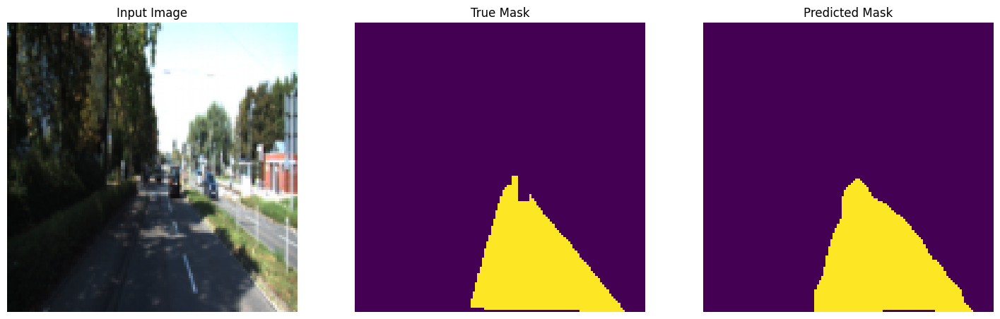

------------------------------------------------------------
Epoch [92/100] | Loss: 0.0248 | mIoU: 0.8877


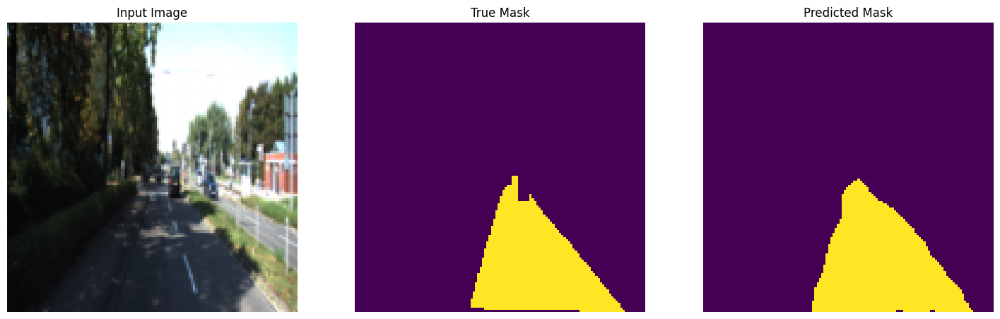

------------------------------------------------------------
Epoch [93/100] | Loss: 0.0248 | mIoU: 0.8852


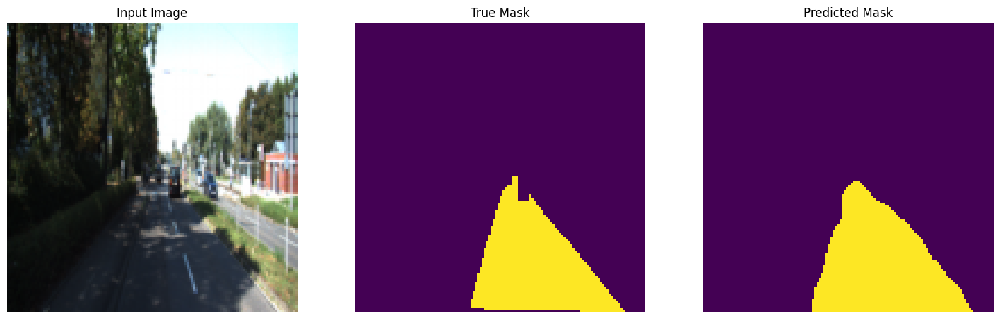

------------------------------------------------------------
Epoch [94/100] | Loss: 0.0245 | mIoU: 0.8767


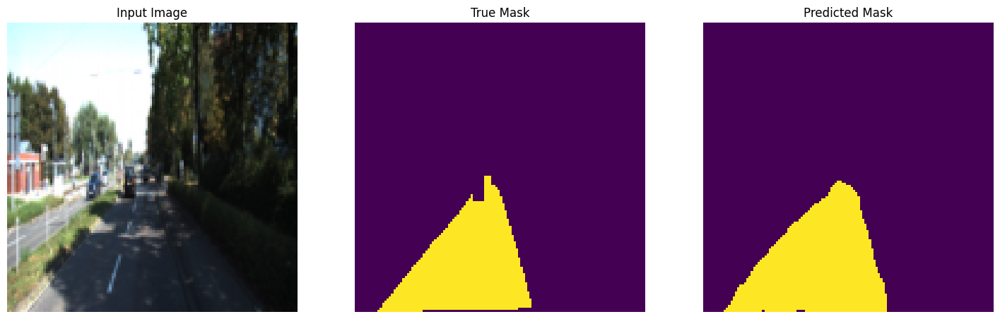

------------------------------------------------------------
Epoch [95/100] | Loss: 0.0246 | mIoU: 0.8916


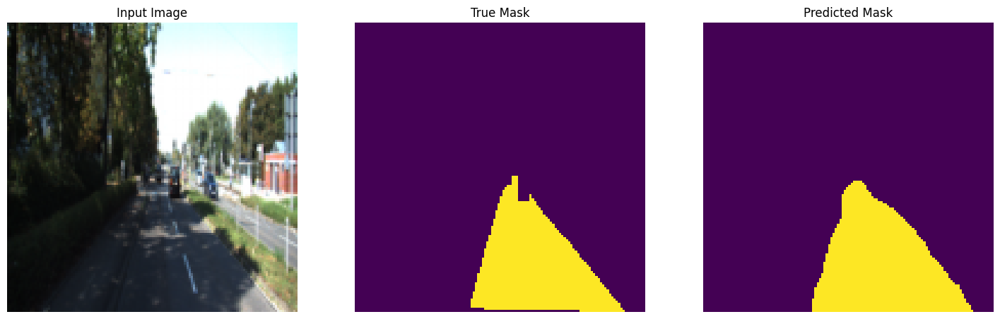

------------------------------------------------------------
Epoch [96/100] | Loss: 0.0244 | mIoU: 0.8856


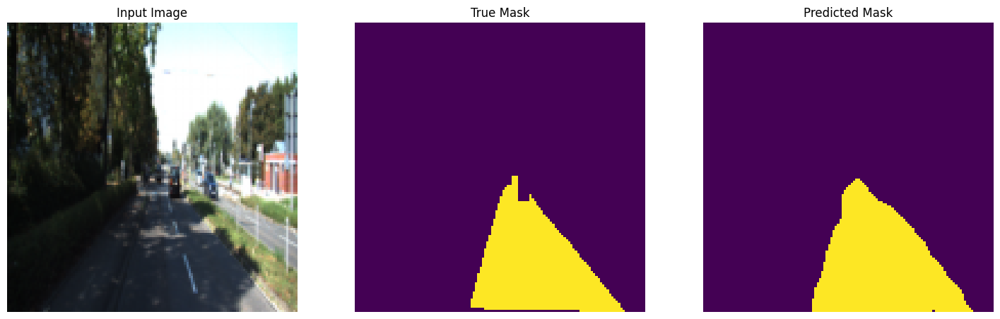

------------------------------------------------------------
Epoch [97/100] | Loss: 0.0240 | mIoU: 0.8861


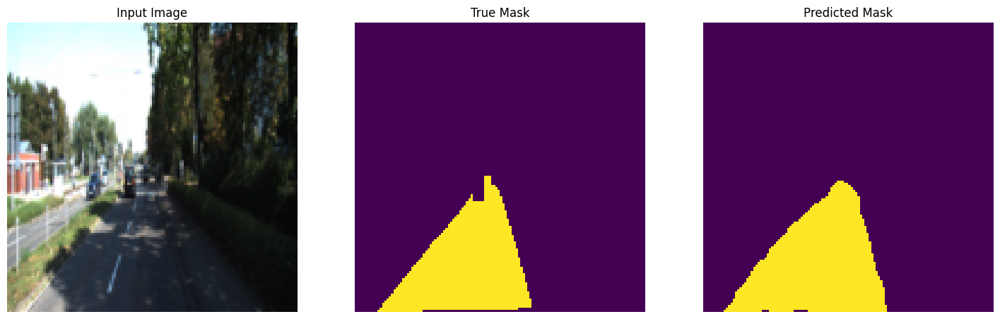

------------------------------------------------------------
Epoch [98/100] | Loss: 0.0238 | mIoU: 0.8837


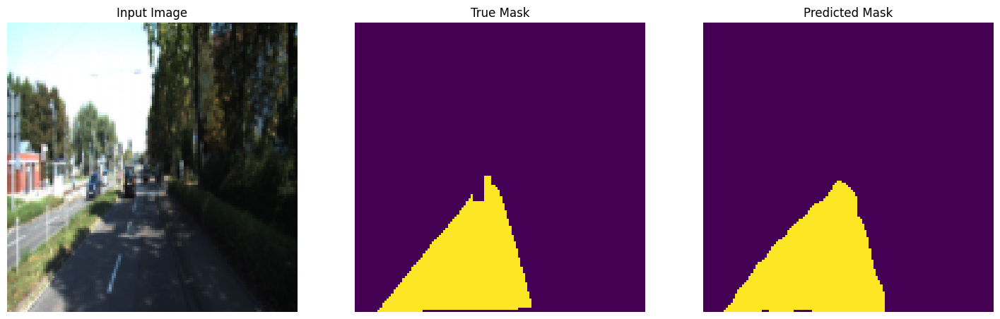

------------------------------------------------------------
Epoch [99/100] | Loss: 0.0236 | mIoU: 0.8797


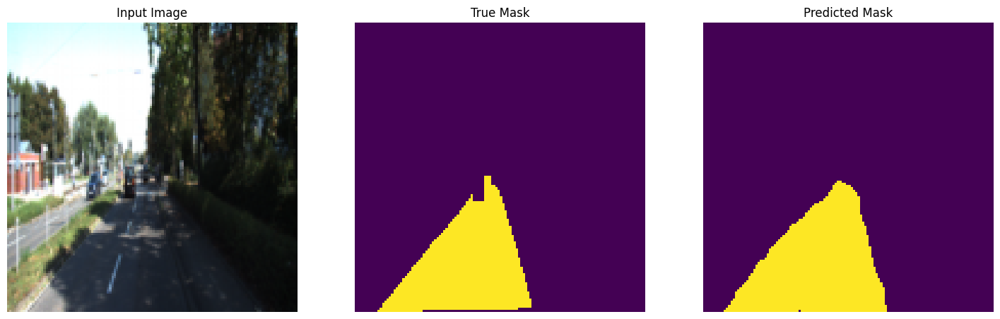

------------------------------------------------------------
Epoch [100/100] | Loss: 0.0235 | mIoU: 0.8919


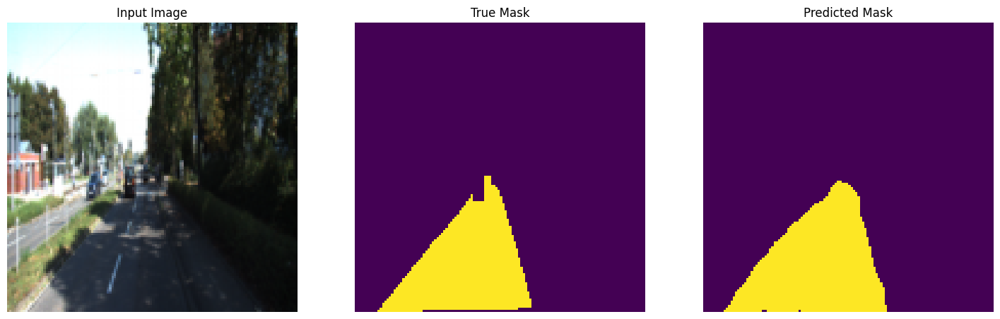

------------------------------------------------------------


In [21]:
# training the model

train_model(model, train_loader, val_loader, 100)

**Evaluating the model**

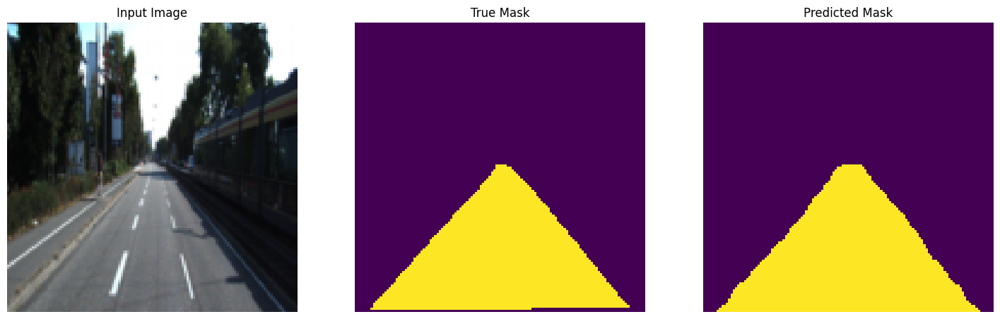

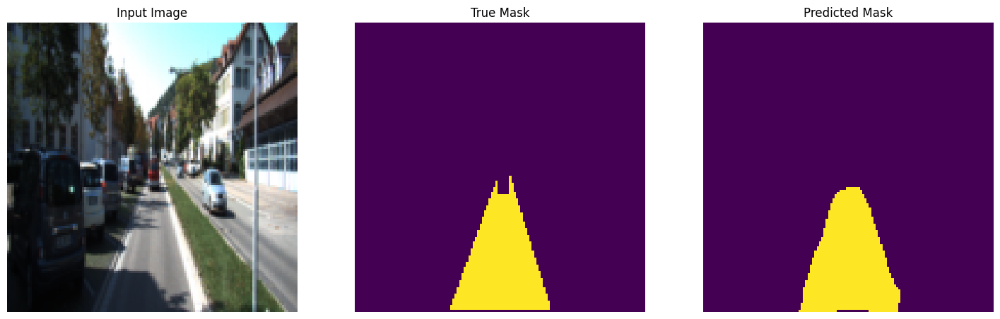

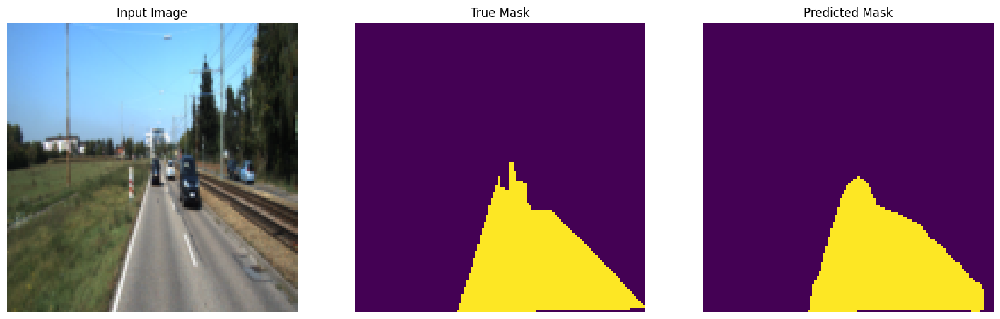

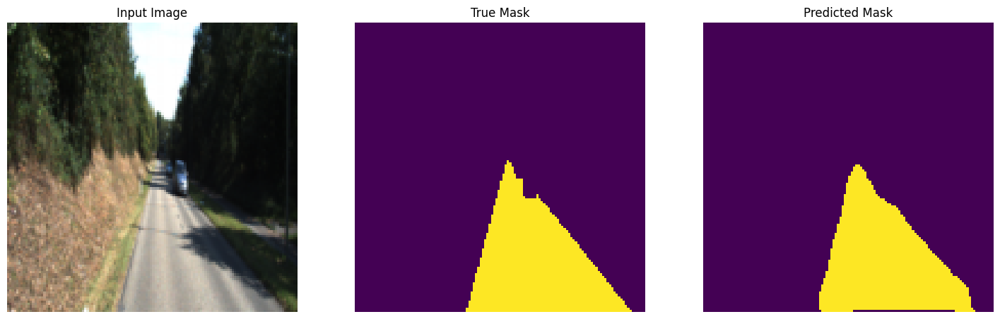

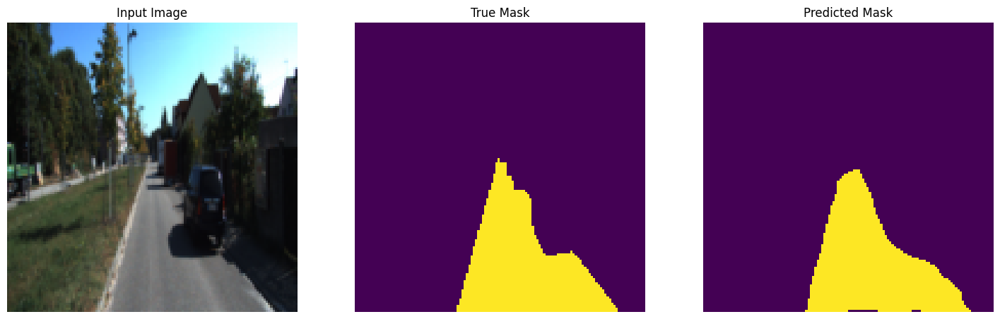

...

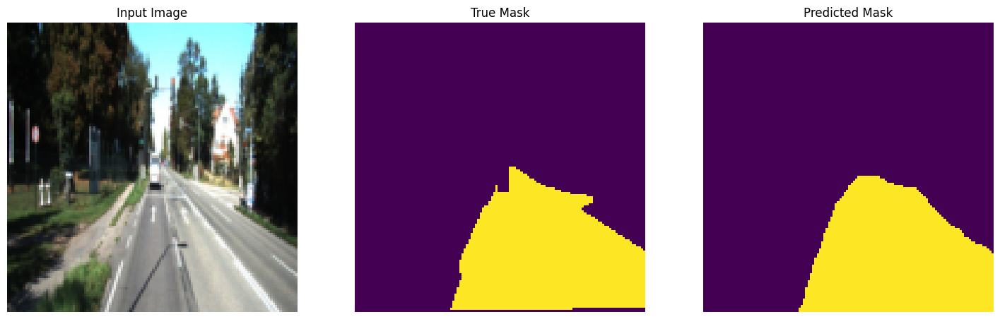

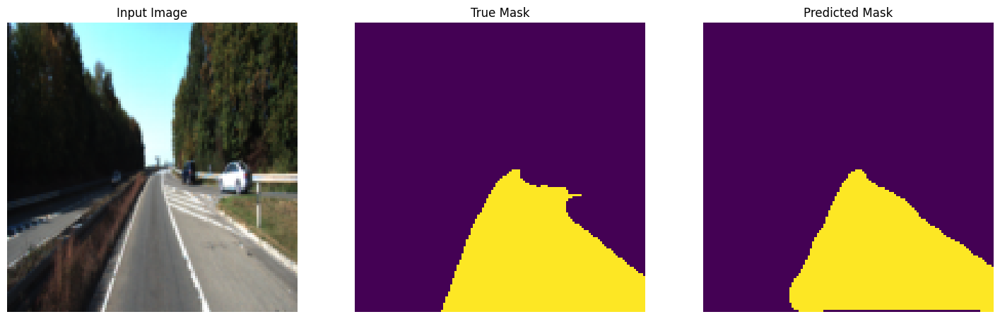

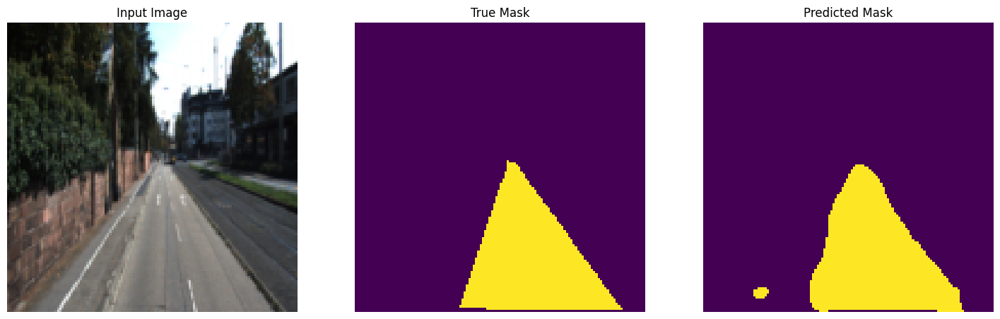

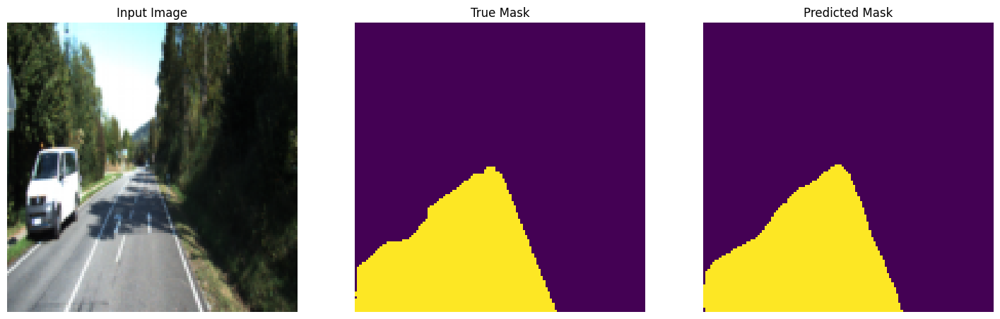

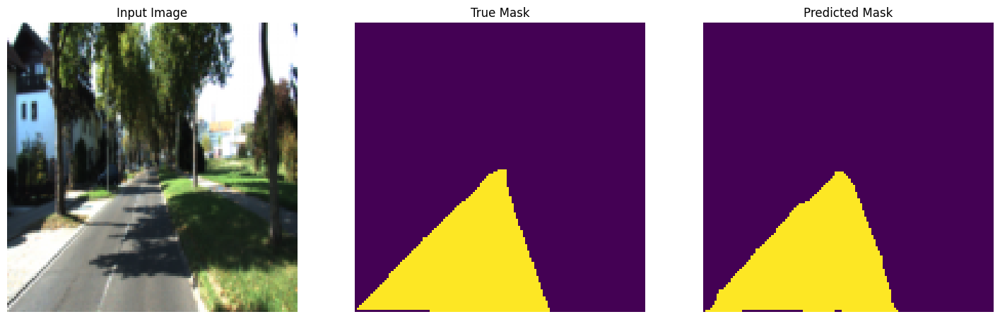

In [22]:
# Running the model on our test dataset

model.eval()
with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(device), masks.to(device).float()
        preds = model(images)

        for image, mask, pred in zip(images, masks, preds):
            pred_binary = (pred > 0.5).float()
            display_sample([image, mask, pred_binary])